# Trabalho de Algoritmos II

## Importação de Bibliotecas


In [ ]:
!pip install ucimlrepo

In [ ]:
import numpy as np
import sklearn as sk
import matplotlib.pyplot as plt
import random
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, silhouette_score
import time

## Funções Principais

In [ ]:
def plotar_pontos_centros(pontos, centros, raio_maximo, k):
    pontos = np.array(pontos)
    centros = np.array(centros)

    plt.scatter(pontos[:, 0], pontos[:, 1], c='blue', label='Pontos')
    plt.scatter(centros[:, 0], centros[:, 1], c='red', label='Centros')
    plt.legend()
    plt.title(f"K-Centros com k={k}\nRaio Máximo: {raio_maximo:.2f}")
    plt.xlabel('Coordenada X')
    plt.ylabel('Coordenada Y')

    for centro in centros:
        circulo = plt.Circle((centro[0], centro[1]), raio_maximo, color='red', fill=False, linestyle='--')
        plt.gca().add_artist(circulo)

    limite_x_min = min(pontos[:, 0].min(), centros[:, 0].min()) - raio_maximo - 1
    limite_x_max = max(pontos[:, 0].max(), centros[:, 0].max()) + raio_maximo + 1
    limite_y_min = min(pontos[:, 1].min(), centros[:, 1].min()) - raio_maximo - 1
    limite_y_max = max(pontos[:, 1].max(), centros[:, 1].max()) + raio_maximo + 1

    plt.xlim(limite_x_min, limite_x_max)
    plt.ylim(limite_y_min, limite_y_max)

    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

In [ ]:
def distancia_minkowski(ponto_a, ponto_b, p=2):
    return np.sum(np.abs(np.array(ponto_a) - np.array(ponto_b)) ** p) ** (1 / p)

def ponto_maxima_distancia(pontos, centros, p=2):
    maior_distancia = -1
    ponto_mais_distante = None
    for ponto in pontos:
        distancia_minima_ate_centros = min(distancia_minkowski(ponto, centro, p) for centro in centros)
        if distancia_minima_ate_centros > maior_distancia:
            maior_distancia = distancia_minima_ate_centros
            ponto_mais_distante = ponto
    return ponto_mais_distante

def calcular_raio_maximo(pontos, centros, p=2):
    raio_maximo = 0
    for ponto in pontos:
        distancia_minima = min(distancia_minkowski(ponto, centro, p) for centro in centros)
        if distancia_minima > raio_maximo:
            raio_maximo = distancia_minima
    return raio_maximo

def k_centros_max_dist(conjunto_de_pontos, k, p=2):

    if k >= len(conjunto_de_pontos):
        return conjunto_de_pontos

    centros = [conjunto_de_pontos[0]]


    while len(centros) < k:

        proximo_centro = ponto_maxima_distancia(conjunto_de_pontos, centros, p)
        centros.append(proximo_centro)

    return centros

In [ ]:
def verificar_agrupamento(pontos, k, raio, distancias):
    S_ = list(range(len(pontos)))  # Usando índices para referenciar os pontos
    C = []

    while S_:
        s = S_.pop(0)
        C.append(s)
        S_ = [ponto for ponto in S_ if distancias[s][ponto] > 2 * raio]

    return len(C) <= k, [pontos[i] for i in C]

def encontrar_raio_otimo(pontos, k, p=2, z=1):
    # Calcular a matriz de distâncias
    n = len(pontos)
    distancias = np.zeros((n, n))

    for i in range(n):
        for j in range(i + 1, n):
            dist = distancia_minkowski(pontos[i], pontos[j], p)
            distancias[i][j] = dist
            distancias[j][i] = dist

    rmax = np.max(distancias)
    intervalo_min = 0
    intervalo_max = rmax
    raio_otimo = rmax
    centros_atuais = []

    intervalos_min = []
    intervalos_max = []

    # intervalo_max = intervalo_min + (intervalo_max - intervalo_min) * z
    while intervalo_min <= intervalo_max * z:

        raio_medio = (intervalo_min + intervalo_max) / 2
        e_possivel, centros = verificar_agrupamento(pontos, k, raio_medio, distancias)

        if e_possivel and len(centros) == k:
            raio_otimo = raio_medio
            centros_atuais = centros
            intervalo_max = raio_medio - 0.001
        elif len(centros) > k:
            intervalo_min = raio_medio + 0.001
        else:
            intervalo_max = raio_medio  - 0.001

    return 2 * (raio_otimo + 0.001), centros_atuais


In [ ]:
def calcular_metricas(clusters, X, sol, imprimir=False):
    """
    Função auxiliar para calcular e imprimir as métricas de Rand e Silhueta.

    Args:
        clusters (list): Lista de etiquetas geradas por um algoritmo de clustering.
        X (list of tuples): Lista de pontos onde cada ponto é uma tupla (var_x, var_y).
        sol (list): Lista opcional de etiquetas reais para calcular métricas de Rand e Silhueta.
    """
    if sol is not None:
        rand_score = adjusted_rand_score(sol, clusters)
        silhouette_score_value = silhouette_score(X, clusters)
        if imprimir == True:
          print("Rand Index:", round(rand_score, 3))
          print("Silhueta:", round(silhouette_score(X, clusters), 3))
        return rand_score, silhouette_score_value
    return None, None

def atribuir_clusters(X, centros, p=1):
    clusters = []
    for ponto in X:
        distancias = [distancia_minkowski(ponto, centro, p) for centro in centros]
        clusters.append(distancias.index(min(distancias)))
    return clusters

## Teste dos Algoritmos

Centros: [[1, 2], [9, 10], [4, 5]]
Raio Máximo: 2.23606797749979


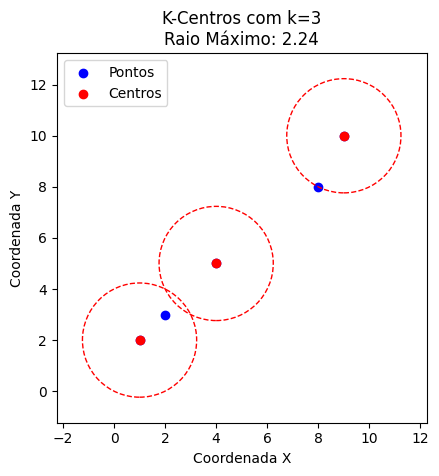

In [ ]:
pontos = [[1, 2], [2, 3], [4, 5], [8, 8], [9, 10]]
k = 3
p = 2

centros = k_centros_max_dist(pontos, k, p)

raio_maximo = calcular_raio_maximo(pontos, centros)

print("Centros:", centros)
print("Raio Máximo:", raio_maximo)

plotar_pontos_centros(pontos, centros, raio_maximo, k)

Raio Ótimo: 2.24048818180582
Centros: [[1, 2], [4, 5], [8, 8]]


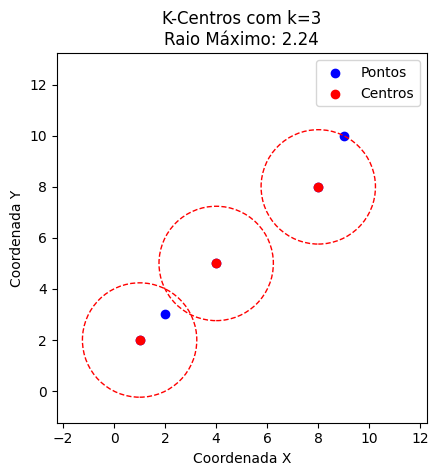

In [ ]:
k = 3
p = 2

raio_otimo, centros = encontrar_raio_otimo(pontos, k)

print("Raio Ótimo:", raio_otimo)
print("Centros:", centros)

plotar_pontos_centros(pontos, centros, raio_otimo, k)

# Plots

## Tabela

In [ ]:
import pandas as pd

a_tabela = pd.DataFrame({
    'Descrição': [],
    'Método': [],
    'Raio': [],
    'Rand': [],
    'Silhueta': [],
    'Tempo': [],
    'K': [],
    'Largura': [],
    'Desvio': []
})

In [ ]:
def adicionar_na_tabela(tabela, descricao, metodo, raio, rand=-2, silhueta=-2,
                        tempo_execucao=0, valor_k=0, largura=0, desvio=0):
    # Criando um dicionário com os dados
    nova_linha = {
        'Descrição': [descricao],
        'Método': [metodo],
        'Raio': [raio],
        'Rand': [rand],
        'Silhueta': [silhueta],
        'Tempo':[tempo_execucao],
        'K': [valor_k],
        'Largura': [largura],
        'Desvio': [desvio]
    }
    # Adicionando a nova linha na tabela
    nova_linha_df = pd.DataFrame(nova_linha)

    # Adicionando a nova linha na tabela usando concat
    tabela = pd.concat([tabela, nova_linha_df], ignore_index=True)
    return tabela

# Dataset Scikit-Learn

## Definindo Função para Plotar

In [ ]:
import time
import warnings
from itertools import cycle, islice

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler

def plotar_pontos_centros(ax, X, centros, raio_maximo, k, title, tempo, k_means=False):
    pontos = np.array(X)
    centros = np.array(centros)

    # Paleta de cores
    cores_fixas = ['blue', 'green', 'orange', 'purple', 'cyan', 'magenta', 'yellow', 'brown', 'pink', 'gray']
    cmap = ListedColormap(cores_fixas[:k])

    cores = []

    # Calcular a distância de cada ponto para cada centro e atribuir a cor correspondente
    for ponto in pontos:
        distancias = np.linalg.norm(ponto - centros, axis=1)
        centro_mais_proximo = np.argmin(distancias)
        cores.append(cmap(centro_mais_proximo))

    ax.scatter(pontos[:, 0], pontos[:, 1], s=10, c=cores, label='Pontos')
    ax.scatter(centros[:, 0], centros[:, 1], s=50, c='red', marker='x', label='Centros')

    if(k_means == False):
        for centro in centros:
            circulo = plt.Circle((centro[0], centro[1]), raio_maximo, color='red', fill=False, linestyle='--')
            ax.add_patch(circulo)

    ax.set_title(title)
    ax.legend()
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')
    ax.text(
        0.99,
        0.01,
        ("%.2fs" % tempo).lstrip("0"),
        transform=ax.transAxes,
        size=15,
        horizontalalignment="right",
        verticalalignment="bottom"
    )
    plt.tight_layout()

In [ ]:
# Gerar e testar diferentes conjuntos de dados
n_samples = 500
seed = 30

noisy_circles = datasets.make_circles(
    n_samples=n_samples, factor=0.5, noise=0.05, random_state=seed
)
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=0.05, random_state=seed)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=seed)
rng = np.random.RandomState(seed)
no_structure = rng.rand(n_samples, 2), None

# Anisotropicly distributed data
random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

# blobs with varied variances
varied = datasets.make_blobs(
    n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state
)

datasets_list = [
    (
        noisy_circles,
        {
            "damping": 0.77,
            "preference": -240,
            "quantile": 0.2,
            "n_clusters": 2,
            "min_samples": 7,
            "xi": 0.08,
        },
    ),
    (
        noisy_moons,
        {
            "damping": 0.75,
            "preference": -220,
            "n_clusters": 2,
            "min_samples": 7,
            "xi": 0.1,
        },
    ),
    (
        varied,
        {
            "eps": 0.18,
            "n_neighbors": 2,
            "min_samples": 7,
            "xi": 0.01,
            "min_cluster_size": 0.2,
        },
    ),
    (
        aniso,
        {
            "eps": 0.15,
            "n_neighbors": 2,
            "min_samples": 7,
            "xi": 0.1,
            "min_cluster_size": 0.2,
        },
    ),
    (blobs, {"min_samples": 7, "xi": 0.1, "min_cluster_size": 0.2}),
    (no_structure, {}),
]

# Aplicando uma transformação anisotrópica ao último conjunto
X, y = datasets.make_blobs(n_samples=n_samples, random_state=seed)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
y_aniso = y

datasets_list[-1] = (X_aniso, y_aniso), {"n_clusters": 3}

## Teste com K = 3 e P = 1

1
K-Centros-Intervalo
Raio Ótimo: 2.5678108513736855
Tempo de Execução: 2.5147829055786133 segundos

K-Centros-Max
Raio Ótimo: 2.5678108513736855
Tempo de Execução: 0.026134252548217773 segundos

K-Means
Raio Ótimo: 1.585151778851839
Tempo de Execução: 0.06294512748718262 segundos
Silhueta: 0.387

2
K-Centros-Intervalo
Raio Ótimo: 1.9081542491485675
Tempo de Execução: 3.982729434967041 segundos

K-Centros-Max
Raio Ótimo: 1.9081542491485675
Tempo de Execução: 0.0740652084350586 segundos

K-Means
Raio Ótimo: 1.6023139749223592
Tempo de Execução: 0.024637937545776367 segundos
Silhueta: 0.445

3
K-Centros-Intervalo
Raio Ótimo: 2.362891606997769
Tempo de Execução: 2.6468870639801025 segundos

K-Centros-Max
Raio Ótimo: 2.362891606997769
Tempo de Execução: 0.04029393196105957 segundos

K-Means
Raio Ótimo: 1.9678492868054291
Tempo de Execução: 0.027287721633911133 segundos
Silhueta: 0.639

4
K-Centros-Intervalo
Raio Ótimo: 2.146812811210622
Tempo de Execução: 2.9605937004089355 segundos

K-Cen

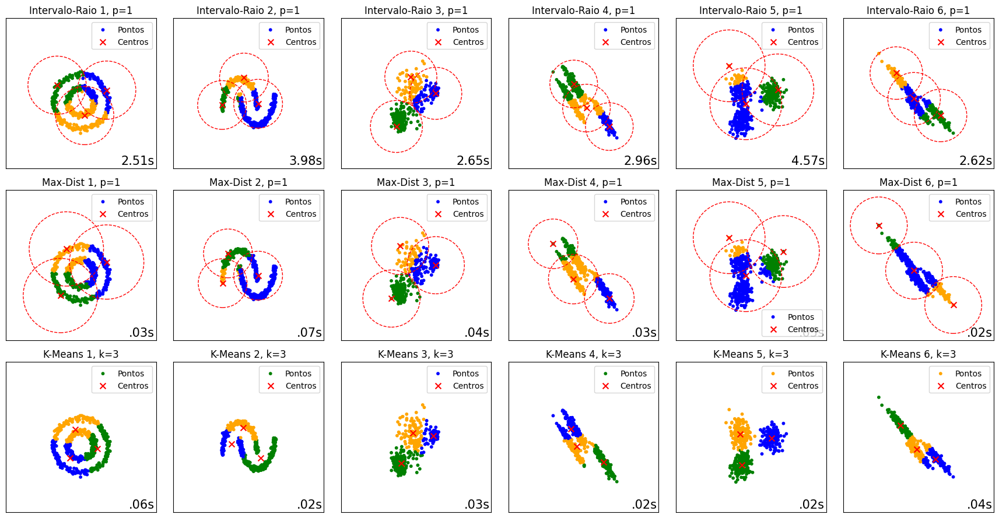

In [ ]:
# Criar subplots
num_datasets = len(datasets_list)
fig, axes = plt.subplots(3, num_datasets, figsize=(18, 9), sharex=True, sharey=True)

plt.subplots_adjust(
    left=0.02, right=0.98, bottom=0.001, top=0.95, wspace=0.05, hspace=0.01
)
axes = axes.flatten()

for i_dataset, (dataset, algo_params) in enumerate(datasets_list):
    X, y = dataset
    X = StandardScaler().fit_transform(X)

    k = 3 # Definindo o valor de k
    print(i_dataset + 1)
    # Plotar para o algoritmo encontrar_raio_otimo, p = 1
    t0 = time.time()
    raio_otimo, centros_otimo = encontrar_raio_otimo(X, k, 1)
    t1 = time.time()
    raio_maximo_otimo = calcular_raio_maximo(X, centros_otimo)
    plotar_pontos_centros(axes[i_dataset], X, centros_otimo, raio_maximo_otimo, k, f"Intervalo-Raio {i_dataset + 1}, p=1", t1 - t0)
    a_tabela['Raio'] = raio_otimo
    print("K-Centros-Intervalo")
    print("Raio Ótimo:", raio_otimo)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("")

    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dado Scikit {i_dataset + 1}',
        metodo='K-Centros-Intervalo P = 1',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    # Plotar para o algoritmo k_centros_max_dist, p = 1
    t0 = time.time()
    centros_k_centros = k_centros_max_dist(X, k, 1)
    t1 = time.time()
    raio_maximo_k_centros = calcular_raio_maximo(X, centros_k_centros)
    plotar_pontos_centros(axes[num_datasets + i_dataset], X, centros_k_centros, raio_maximo_k_centros, k, f"Max-Dist {i_dataset + 1}, p=1", t1 - t0)
    print("K-Centros-Max")
    print("Raio Ótimo:", raio_otimo)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("")

    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dado Scikit {i_dataset + 1}',
        metodo='K-Centros-Max P = 1',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    # Plotar a execução do K-Means
    seed = numero_aleatorio = random.randint(1, 100)
    t0 = time.time()
    kmeans = KMeans(n_clusters=k, random_state=seed, n_init=10)
    clusters = kmeans.fit_predict(X)
    centros_kmeans = kmeans.cluster_centers_
    t1 = time.time()
    raio_maximo_k_means = calcular_raio_maximo(X, centros_kmeans)
    plotar_pontos_centros(axes[2 * num_datasets + i_dataset], X, centros_kmeans, raio_maximo_k_means, k, f"K-Means {i_dataset + 1}, k={k}", t1 - t0, k_means = True)
    print("K-Means")
    print("Raio Ótimo:", raio_maximo_k_means)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("Silhueta:", round(silhouette_score(X, clusters), 3))
    print("")

    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dado Scikit {i_dataset + 1}',
        metodo='K-Means',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

plt.tight_layout()
plt.show()

## Teste com K = 3 e P = 2

1
K-Centros-Intervalo
Raio Ótimo: 1.920644607693919
Tempo de Execução: 1.6642496585845947 segundos

K-Centros-Max
Raio Ótimo: 1.920644607693919
Tempo de Execução: 0.02608799934387207 segundos

K-Means
Raio Ótimo: 1.585151778851839
Tempo de Execução: 0.01909160614013672 segundos
Silhueta: 0.387

2
K-Centros-Intervalo
Raio Ótimo: 1.608249819208859
Tempo de Execução: 1.691089391708374 segundos

K-Centros-Max
Raio Ótimo: 1.608249819208859
Tempo de Execução: 0.01291656494140625 segundos

K-Means
Raio Ótimo: 1.6023139749223592
Tempo de Execução: 0.013298273086547852 segundos
Silhueta: 0.445

3
K-Centros-Intervalo
Raio Ótimo: 2.277908836871287
Tempo de Execução: 1.2057044506072998 segundos

K-Centros-Max
Raio Ótimo: 2.277908836871287
Tempo de Execução: 0.011161088943481445 segundos

K-Means
Raio Ótimo: 1.9678492868054291
Tempo de Execução: 0.013263702392578125 segundos
Silhueta: 0.639

4
K-Centros-Intervalo
Raio Ótimo: 1.569954785831656
Tempo de Execução: 1.217667579650879 segundos

K-Centros

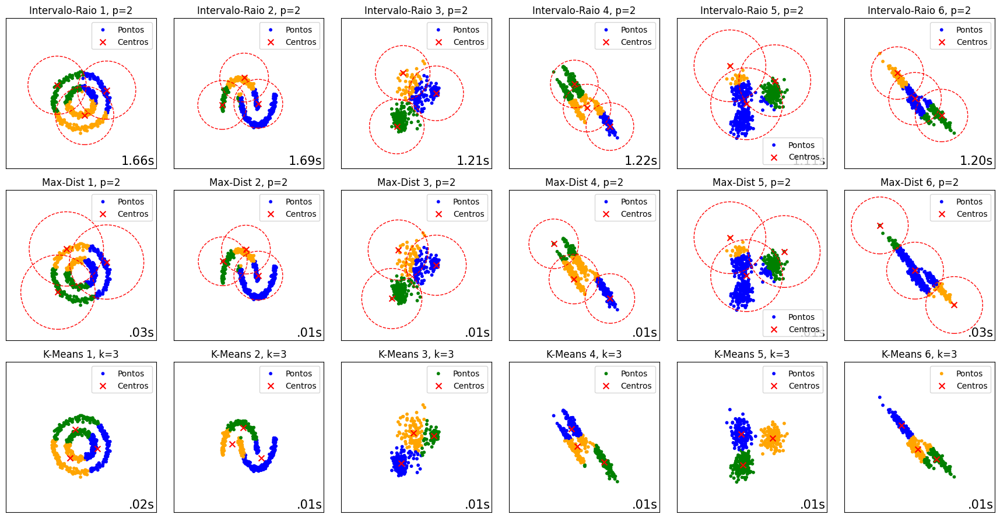

In [ ]:
# Criar subplots
num_datasets = len(datasets_list)
fig, axes = plt.subplots(3, num_datasets, figsize=(18, 9), sharex=True, sharey=True)

plt.subplots_adjust(
    left=0.02, right=0.98, bottom=0.001, top=0.95, wspace=0.05, hspace=0.01
)
axes = axes.flatten()

for i_dataset, (dataset, algo_params) in enumerate(datasets_list):
    X, y = dataset
    X = StandardScaler().fit_transform(X)

    k = 3 # Definindo o valor de k
    print(i_dataset + 1)
    # Plotar para o algoritmo encontrar_raio_otimo, p = 2
    t0 = time.time()
    raio_otimo, centros_otimo = encontrar_raio_otimo(X, k)
    t1 = time.time()
    raio_maximo_otimo = calcular_raio_maximo(X, centros_otimo)
    plotar_pontos_centros(axes[i_dataset], X, centros_otimo, raio_maximo_otimo, k, f"Intervalo-Raio {i_dataset + 1}, p=2", t1 - t0)
    print("K-Centros-Intervalo")
    print("Raio Ótimo:", raio_otimo)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("")

    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dado Scikit {i_dataset + 1}',
        metodo='K-Centros-Intervalo P = 2',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    # Plotar para o algoritmo k_centros_max_dist, p = 2
    t0 = time.time()
    centros_k_centros = k_centros_max_dist(X, k)
    t1 = time.time()
    raio_maximo_k_centros = calcular_raio_maximo(X, centros_k_centros)
    plotar_pontos_centros(axes[num_datasets + i_dataset], X, centros_k_centros, raio_maximo_k_centros, k, f"Max-Dist {i_dataset + 1}, p=2", t1 - t0)
    print("K-Centros-Max")
    print("Raio Ótimo:", raio_otimo)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("")

    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dado Scikit {i_dataset + 1}',
        metodo='K-Centros-Max P = 2',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    # Plotar a execução do K-Means
    seed = numero_aleatorio = random.randint(1, 100)
    t0 = time.time()
    kmeans = KMeans(n_clusters=k, random_state=seed, n_init=10)
    clusters = kmeans.fit_predict(X)
    centros_kmeans = kmeans.cluster_centers_
    t1 = time.time()
    raio_maximo_k_means = calcular_raio_maximo(X, centros_kmeans)
    plotar_pontos_centros(axes[2 * num_datasets + i_dataset], X, centros_kmeans, raio_maximo_k_means, k, f"K-Means {i_dataset + 1}, k={k}", t1 - t0, k_means = True)
    print("K-Means")
    print("Raio Ótimo:", raio_maximo_k_means)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("Silhueta:", round(silhouette_score(X, clusters), 3))
    print("")

plt.tight_layout()
plt.show()

## Teste com Parâmetro de Largura

1
K-Centros-Intervalo
Raio Ótimo: 2.023395142261906
Tempo de Execução: 1.9049217700958252 segundos

1
K-Centros-Intervalo
Raio Ótimo: 2.023395142261906
Tempo de Execução: 1.3646111488342285 segundos

1
K-Centros-Intervalo
Raio Ótimo: 2.023395142261906
Tempo de Execução: 1.1420581340789795 segundos

1
K-Centros-Intervalo
Raio Ótimo: 2.023395142261906
Tempo de Execução: 1.0853447914123535 segundos

1
K-Centros-Intervalo
Raio Ótimo: 2.023395142261906
Tempo de Execução: 1.1193344593048096 segundos

1
K-Centros-Intervalo
Raio Ótimo: 2.023395142261906
Tempo de Execução: 1.751668930053711 segundos

2
K-Centros-Intervalo
Raio Ótimo: 1.8929285228389328
Tempo de Execução: 1.7868015766143799 segundos

2
K-Centros-Intervalo
Raio Ótimo: 1.8929285228389328
Tempo de Execução: 1.1837358474731445 segundos

2
K-Centros-Intervalo
Raio Ótimo: 1.8929285228389328
Tempo de Execução: 1.7838027477264404 segundos

2
K-Centros-Intervalo
Raio Ótimo: 1.8929285228389328
Tempo de Execução: 1.4227709770202637 segundo

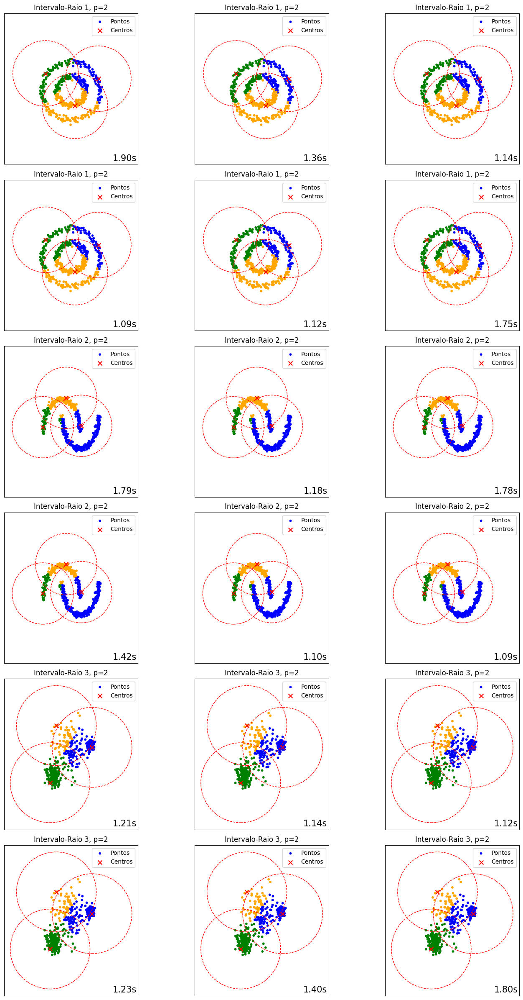

In [ ]:
# Criar subplots
num_datasets = 3
fig, axes = plt.subplots(6, num_datasets, figsize=(20, 24), sharex=True, sharey=True)

plt.subplots_adjust(
    left=0.02, right=0.98, bottom=0.001, top=0.95, wspace=0.05, hspace=0.01
)
axes = axes.flatten()

valores_z = [0.01, 0.05, 0.10, 0.15, 0.20, 0.25]

i = 0

for i_dataset, (dataset, algo_params) in enumerate(datasets_list[0:3]):
  for z in valores_z:
      X, y = dataset
      X = StandardScaler().fit_transform(X)

      k = 3 # Definindo o valor de k
      print(i_dataset + 1)
      # Plotar para o algoritmo encontrar_raio_otimo, p = 2
      t0 = time.time()
      raio_otimo, centros_otimo = encontrar_raio_otimo(X, k, z=z)
      t1 = time.time()
      # raio_maximo_otimo = calcular_raio_maximo(X, centros_otimo)
      plotar_pontos_centros(axes[i], X, centros_otimo, raio_otimo, k, f"Intervalo-Raio {i_dataset + 1}, p=2", t1 - t0)
      i+=1
      print("K-Centros-Intervalo")
      print("Raio Ótimo:", raio_otimo)
      print("Tempo de Execução:", t1-t0,"segundos")
      print("")

      a_tabela = adicionar_na_tabela(
          tabela= a_tabela,
          descricao=f'Dado Scikit {i_dataset + 1}',
          metodo='K-Centros-Intervalo P = 2',
          raio= raio_otimo,
          tempo_execucao=t1-t0,
          valor_k= k,
          desvio= 0,
          largura= 0
      )

plt.tight_layout()
plt.show()

1
K-Centros-Intervalo
Raio Ótimo: 2.7795330991613674
Tempo de Execução: 1.1496009826660156 segundos

1
K-Centros-Intervalo
Raio Ótimo: 2.7795330991613674
Tempo de Execução: 1.1332457065582275 segundos

1
K-Centros-Intervalo
Raio Ótimo: 2.7795330991613674
Tempo de Execução: 1.226600170135498 segundos

1
K-Centros-Intervalo
Raio Ótimo: 2.7795330991613674
Tempo de Execução: 1.1871776580810547 segundos

1
K-Centros-Intervalo
Raio Ótimo: 2.7795330991613674
Tempo de Execução: 1.1824040412902832 segundos

1
K-Centros-Intervalo
Raio Ótimo: 2.7795330991613674
Tempo de Execução: 1.3712809085845947 segundos

2
K-Centros-Intervalo
Raio Ótimo: 2.654823303163224
Tempo de Execução: 1.9030182361602783 segundos

2
K-Centros-Intervalo
Raio Ótimo: 2.654823303163224
Tempo de Execução: 1.3338737487792969 segundos

2
K-Centros-Intervalo
Raio Ótimo: 2.654823303163224
Tempo de Execução: 1.1922523975372314 segundos

2
K-Centros-Intervalo
Raio Ótimo: 2.654823303163224
Tempo de Execução: 1.1580047607421875 segun

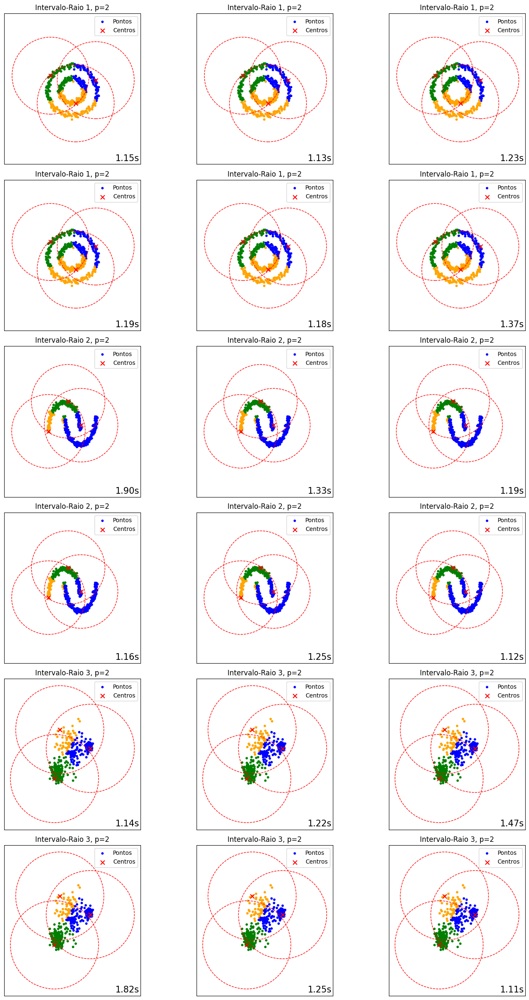

In [ ]:
# Criar subplots
num_datasets = 3
fig, axes = plt.subplots(6, num_datasets, figsize=(20, 24), sharex=True, sharey=True)

plt.subplots_adjust(
    left=0.02, right=0.98, bottom=0.001, top=0.95, wspace=0.05, hspace=0.01
)
axes = axes.flatten()

valores_z = [0.01, 0.05, 0.10, 0.15, 0.20, 0.25]

i = 0

for i_dataset, (dataset, algo_params) in enumerate(datasets_list[0:3]):
  for z in valores_z:
      X, y = dataset
      X = StandardScaler().fit_transform(X)

      k = 3 # Definindo o valor de k
      print(i_dataset + 1)
      # Plotar para o algoritmo encontrar_raio_otimo, p = 1
      t0 = time.time()
      raio_otimo, centros_otimo = encontrar_raio_otimo(X, k, p = 1, z=z)
      t1 = time.time()
      # raio_maximo_otimo = calcular_raio_maximo(X, centros_otimo)
      plotar_pontos_centros(axes[i], X, centros_otimo, raio_otimo, k, f"Intervalo-Raio {i_dataset + 1}, p=2", t1 - t0)
      i+=1
      print("K-Centros-Intervalo")
      print("Raio Ótimo:", raio_otimo)
      print("Tempo de Execução:", t1-t0,"segundos")
      print("")

      a_tabela = adicionar_na_tabela(
          tabela= a_tabela,
          descricao=f'Dado Scikit {i_dataset + 1}',
          metodo='K-Centros-Intervalo P = 2',
          raio= raio_otimo,
          tempo_execucao=t1-t0,
          valor_k= k,
          desvio= 0,
          largura= 0
      )

plt.tight_layout()
plt.show()

# Distribuição Normal Multivariada

In [ ]:
# Parâmetros
n_samples = 300
n_datasets = 10
random_state = 42
np.random.seed(random_state)

# Definindo os centros e desvios-padrão (1, 3 e 1/3)
centers = [
    (np.array([0, 0]), np.array([[1, 0], [0, 1]])),
    (np.array([5, 5]), np.array([[9, 0], [0, 9]])),
    (np.array([-5, 5]), np.array([[1/9, 0], [0, 1/9]]))
]

# Gerando 10 conjuntos de dados para cada centro com diferentes desvios padrão
datasets_list = []
for _ in range(n_datasets):
    for center, cov_matrix in centers:
        X = np.random.multivariate_normal(center, cov_matrix, n_samples)
        datasets_list.append(X)

# Agora, datasets_list contém 30 conjuntos de dados (10 por centro)
num_datasets = len(datasets_list)

# Testes com Distribuição Normal

## Testes com K = 3 e P = 2


1
K-Centros-Intervalo
Raio Ótimo: 2.9480921642826488
Tempo de Execução: 0.4994058609008789 segundos

K-Centros-Max
Raio Ótimo: 2.9480921642826488
Tempo de Execução: 0.011792659759521484 segundos

K-Means
Raio Ótimo: 3.0338014417637464
Tempo de Execução: 0.0131378173828125 segundos
Silhueta: 0.356



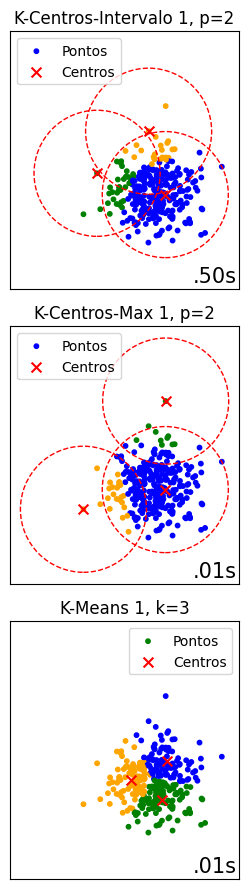


2
K-Centros-Intervalo
Raio Ótimo: 2.4316814205841086
Tempo de Execução: 0.4906759262084961 segundos

K-Centros-Max
Raio Ótimo: 2.4316814205841086
Tempo de Execução: 0.011908531188964844 segundos

K-Means
Raio Ótimo: 2.529597508196603
Tempo de Execução: 0.01736283302307129 segundos
Silhueta: 0.339



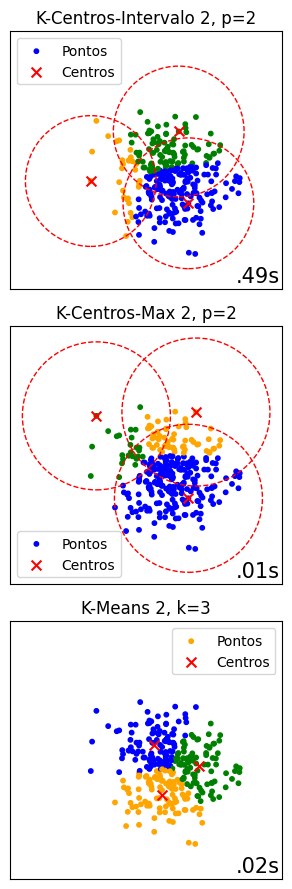


3
K-Centros-Intervalo
Raio Ótimo: 2.720252935927658
Tempo de Execução: 0.39035534858703613 segundos

K-Centros-Max
Raio Ótimo: 2.720252935927658
Tempo de Execução: 0.011809349060058594 segundos

K-Means
Raio Ótimo: 2.406000516042025
Tempo de Execução: 0.014514446258544922 segundos
Silhueta: 0.342



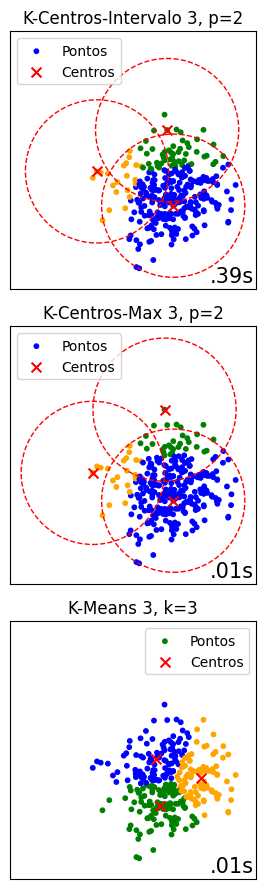


4
K-Centros-Intervalo
Raio Ótimo: 3.4291201918798677
Tempo de Execução: 0.8803367614746094 segundos

K-Centros-Max
Raio Ótimo: 3.4291201918798677
Tempo de Execução: 0.011697769165039062 segundos

K-Means
Raio Ótimo: 3.206684147674365
Tempo de Execução: 0.016076326370239258 segundos
Silhueta: 0.331



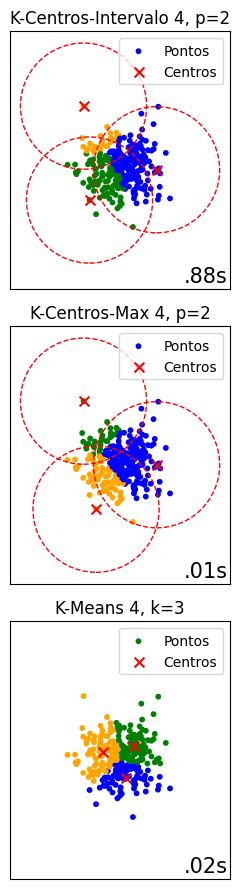


5
K-Centros-Intervalo
Raio Ótimo: 2.9533892122572096
Tempo de Execução: 1.4462149143218994 segundos

K-Centros-Max
Raio Ótimo: 2.9533892122572096
Tempo de Execução: 0.016791820526123047 segundos

K-Means
Raio Ótimo: 2.819346019344048
Tempo de Execução: 0.021090030670166016 segundos
Silhueta: 0.354



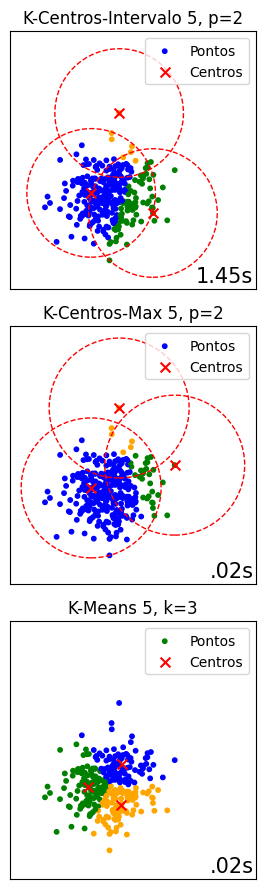


6
K-Centros-Intervalo
Raio Ótimo: 2.463738155533921
Tempo de Execução: 0.6879305839538574 segundos

K-Centros-Max
Raio Ótimo: 2.463738155533921
Tempo de Execução: 0.011572122573852539 segundos

K-Means
Raio Ótimo: 2.51878060053945
Tempo de Execução: 0.018909931182861328 segundos
Silhueta: 0.344



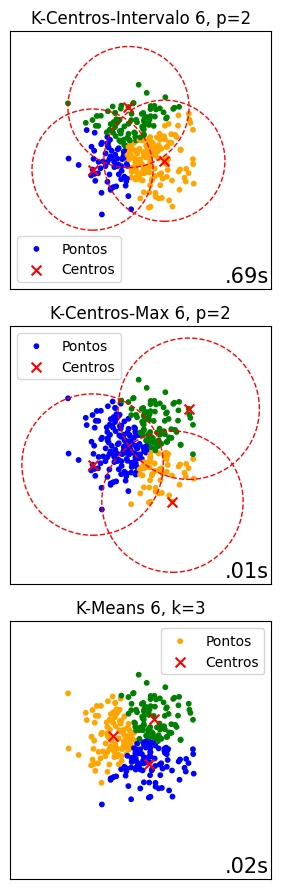


7
K-Centros-Intervalo
Raio Ótimo: 2.7417929393900646
Tempo de Execução: 0.41024112701416016 segundos

K-Centros-Max
Raio Ótimo: 2.7417929393900646
Tempo de Execução: 0.015212059020996094 segundos

K-Means
Raio Ótimo: 3.4247191261705616
Tempo de Execução: 0.013521909713745117 segundos
Silhueta: 0.335



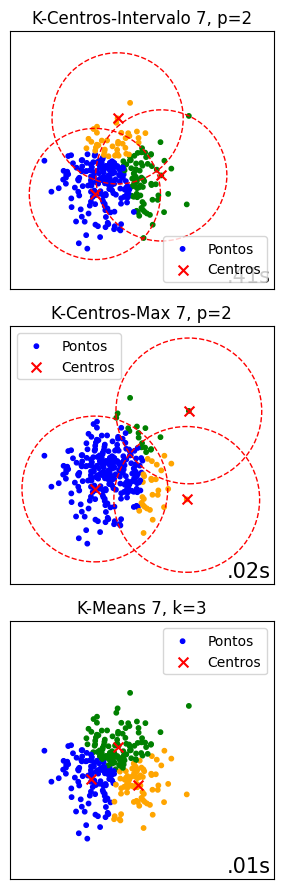


8
K-Centros-Intervalo
Raio Ótimo: 2.9285708315381385
Tempo de Execução: 0.43388819694519043 segundos

K-Centros-Max
Raio Ótimo: 2.9285708315381385
Tempo de Execução: 0.01187443733215332 segundos

K-Means
Raio Ótimo: 2.695687121199278
Tempo de Execução: 0.01604175567626953 segundos
Silhueta: 0.369



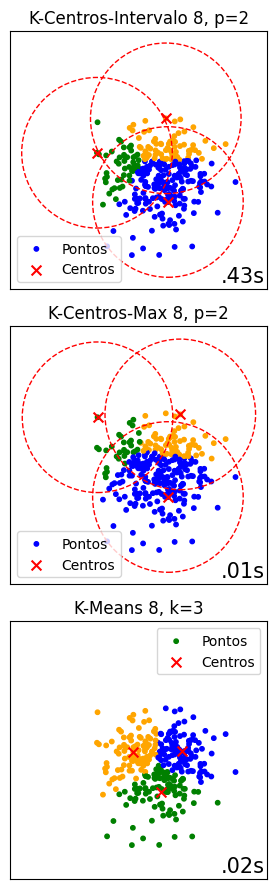


9
K-Centros-Intervalo
Raio Ótimo: 3.036205133663062
Tempo de Execução: 0.43179941177368164 segundos

K-Centros-Max
Raio Ótimo: 3.036205133663062
Tempo de Execução: 0.01729726791381836 segundos

K-Means
Raio Ótimo: 2.876695783026737
Tempo de Execução: 0.015290260314941406 segundos
Silhueta: 0.331



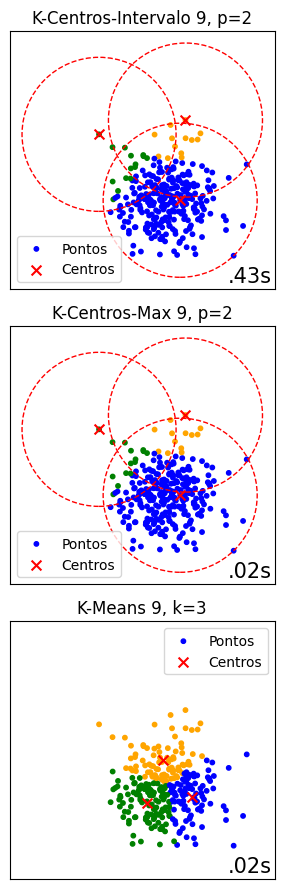


10
K-Centros-Intervalo
Raio Ótimo: 2.5460023828505705
Tempo de Execução: 0.4625675678253174 segundos

K-Centros-Max
Raio Ótimo: 2.5460023828505705
Tempo de Execução: 0.011862039566040039 segundos

K-Means
Raio Ótimo: 2.179910466085123
Tempo de Execução: 0.015190362930297852 segundos
Silhueta: 0.339



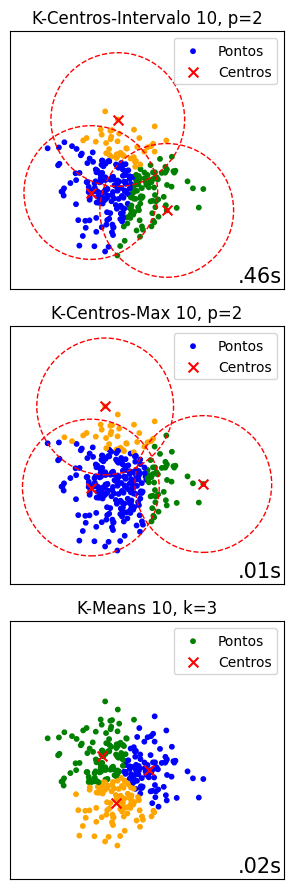


11
K-Centros-Intervalo
Raio Ótimo: 2.52325049991645
Tempo de Execução: 0.40829014778137207 segundos

K-Centros-Max
Raio Ótimo: 2.52325049991645
Tempo de Execução: 0.017247676849365234 segundos

K-Means
Raio Ótimo: 2.2400625438345023
Tempo de Execução: 0.014513254165649414 segundos
Silhueta: 0.36



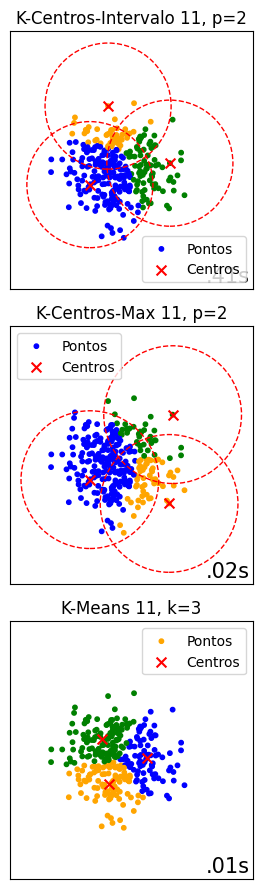


12
K-Centros-Intervalo
Raio Ótimo: 2.796585026990898
Tempo de Execução: 0.41362953186035156 segundos

K-Centros-Max
Raio Ótimo: 2.796585026990898
Tempo de Execução: 0.016869068145751953 segundos

K-Means
Raio Ótimo: 2.9607057490344704
Tempo de Execução: 0.013497591018676758 segundos
Silhueta: 0.328



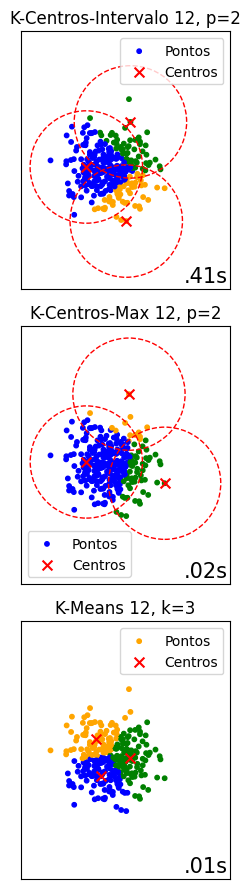


13
K-Centros-Intervalo
Raio Ótimo: 3.004549924897794
Tempo de Execução: 0.4076981544494629 segundos

K-Centros-Max
Raio Ótimo: 3.004549924897794
Tempo de Execução: 0.011964082717895508 segundos

K-Means
Raio Ótimo: 2.797662585075742
Tempo de Execução: 0.015300989151000977 segundos
Silhueta: 0.358



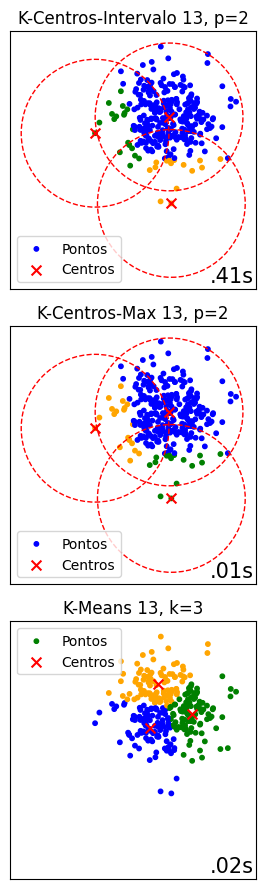


14
K-Centros-Intervalo
Raio Ótimo: 3.2064186713514387
Tempo de Execução: 0.40786075592041016 segundos

K-Centros-Max
Raio Ótimo: 3.2064186713514387
Tempo de Execução: 0.014897823333740234 segundos

K-Means
Raio Ótimo: 2.836243883023095
Tempo de Execução: 0.016994953155517578 segundos
Silhueta: 0.342



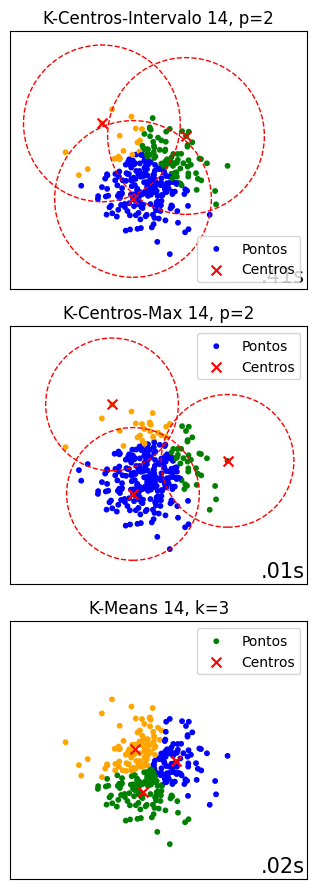


15
K-Centros-Intervalo
Raio Ótimo: 2.9679531370533065
Tempo de Execução: 0.4543888568878174 segundos

K-Centros-Max
Raio Ótimo: 2.9679531370533065
Tempo de Execução: 0.017527341842651367 segundos

K-Means
Raio Ótimo: 2.6708003960755455
Tempo de Execução: 0.028484344482421875 segundos
Silhueta: 0.343



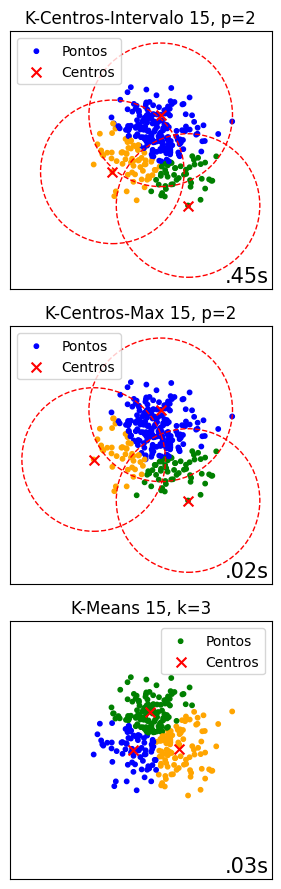


16
K-Centros-Intervalo
Raio Ótimo: 2.466268619202303
Tempo de Execução: 0.6298606395721436 segundos

K-Centros-Max
Raio Ótimo: 2.466268619202303
Tempo de Execução: 0.01483917236328125 segundos

K-Means
Raio Ótimo: 2.3755241636356157
Tempo de Execução: 0.025316953659057617 segundos
Silhueta: 0.337



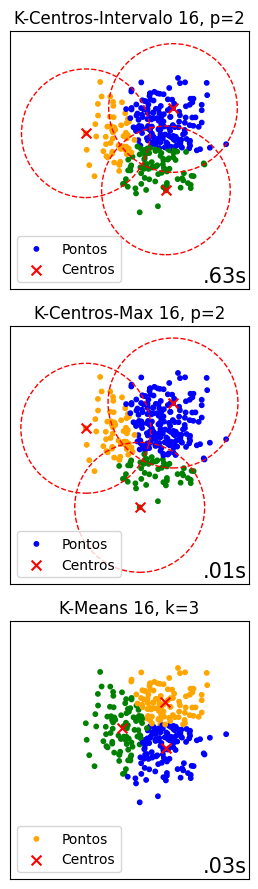


17
K-Centros-Intervalo
Raio Ótimo: 2.4920227836865245
Tempo de Execução: 0.7293355464935303 segundos

K-Centros-Max
Raio Ótimo: 2.4920227836865245
Tempo de Execução: 0.014111042022705078 segundos

K-Means
Raio Ótimo: 2.958453866463899
Tempo de Execução: 0.0206449031829834 segundos
Silhueta: 0.335



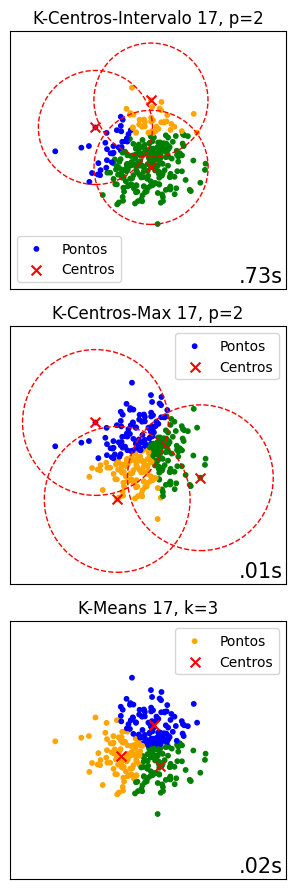


18
K-Centros-Intervalo
Raio Ótimo: 2.7118016104592
Tempo de Execução: 0.3856058120727539 segundos

K-Centros-Max
Raio Ótimo: 2.7118016104592
Tempo de Execução: 0.011847734451293945 segundos

K-Means
Raio Ótimo: 2.7488249722941216
Tempo de Execução: 0.013294696807861328 segundos
Silhueta: 0.349



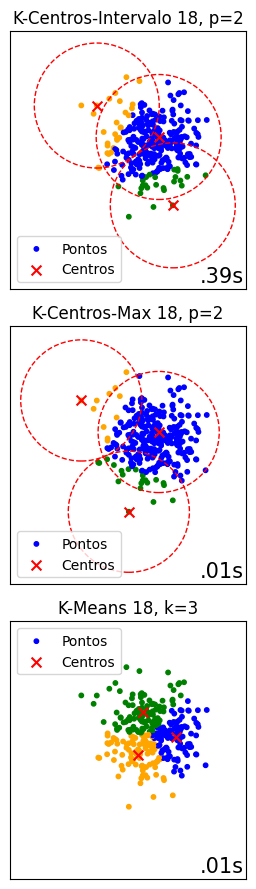


19
K-Centros-Intervalo
Raio Ótimo: 3.158150058519383
Tempo de Execução: 0.4008193016052246 segundos

K-Centros-Max
Raio Ótimo: 3.158150058519383
Tempo de Execução: 0.011904239654541016 segundos

K-Means
Raio Ótimo: 2.8533482108816854
Tempo de Execução: 0.014761924743652344 segundos
Silhueta: 0.357



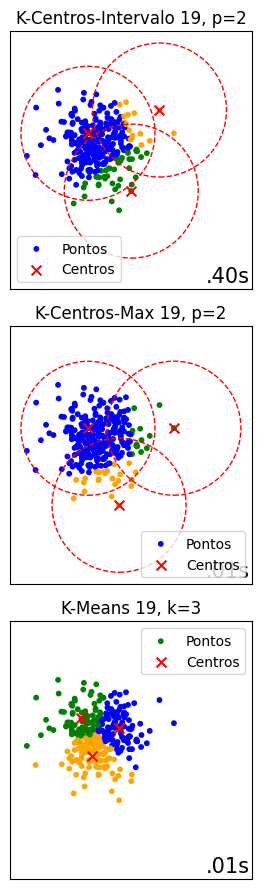


20
K-Centros-Intervalo
Raio Ótimo: 3.11099327849159
Tempo de Execução: 0.4081907272338867 segundos

K-Centros-Max
Raio Ótimo: 3.11099327849159
Tempo de Execução: 0.011936664581298828 segundos

K-Means
Raio Ótimo: 2.902812591895716
Tempo de Execução: 0.012584209442138672 segundos
Silhueta: 0.351



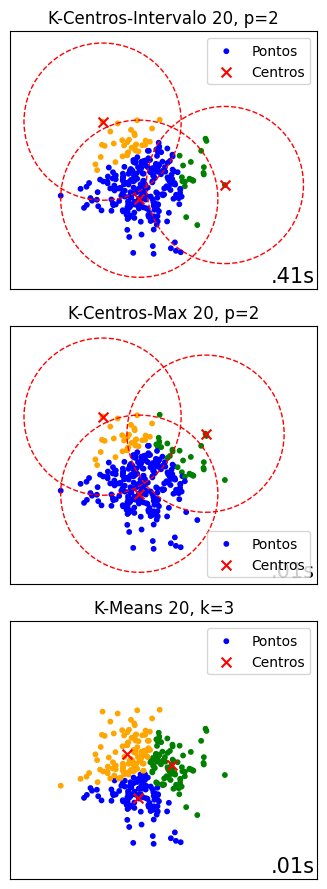


21
K-Centros-Intervalo
Raio Ótimo: 2.9218237700293406
Tempo de Execução: 0.4290637969970703 segundos

K-Centros-Max
Raio Ótimo: 2.9218237700293406
Tempo de Execução: 0.011922597885131836 segundos

K-Means
Raio Ótimo: 2.654807670111976
Tempo de Execução: 0.013307332992553711 segundos
Silhueta: 0.335



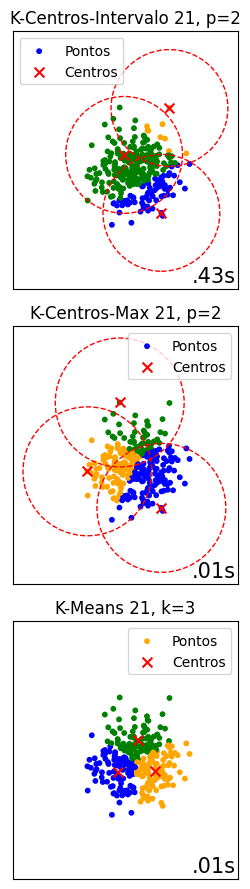


22
K-Centros-Intervalo
Raio Ótimo: 2.9760122060611636
Tempo de Execução: 0.41535162925720215 segundos

K-Centros-Max
Raio Ótimo: 2.9760122060611636
Tempo de Execução: 0.012452840805053711 segundos

K-Means
Raio Ótimo: 2.7745324580392046
Tempo de Execução: 0.018257856369018555 segundos
Silhueta: 0.335



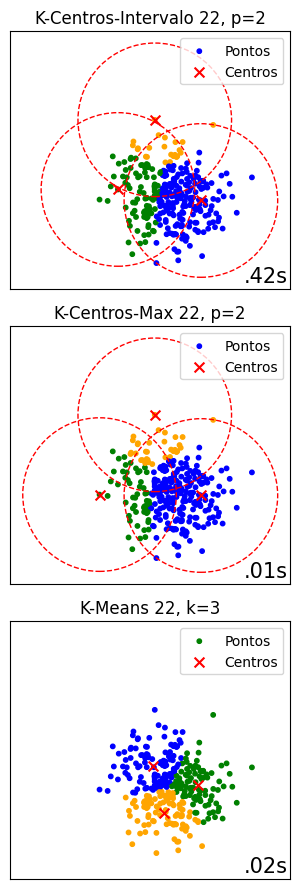


23
K-Centros-Intervalo
Raio Ótimo: 2.7431498836392674
Tempo de Execução: 0.422717809677124 segundos

K-Centros-Max
Raio Ótimo: 2.7431498836392674
Tempo de Execução: 0.017117023468017578 segundos

K-Means
Raio Ótimo: 3.060474470804228
Tempo de Execução: 0.014046669006347656 segundos
Silhueta: 0.376



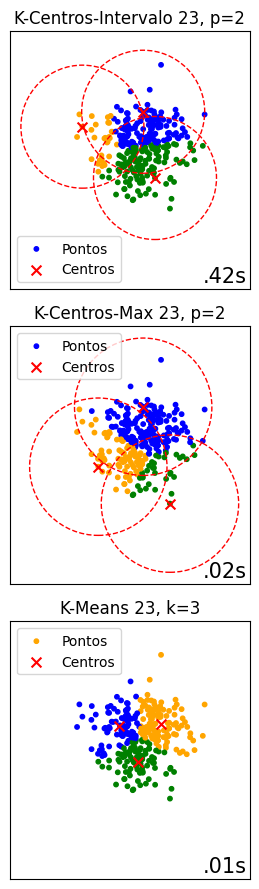


24
K-Centros-Intervalo
Raio Ótimo: 2.725344254487932
Tempo de Execução: 0.44296979904174805 segundos

K-Centros-Max
Raio Ótimo: 2.725344254487932
Tempo de Execução: 0.011955738067626953 segundos

K-Means
Raio Ótimo: 2.3073539022396887
Tempo de Execução: 0.017051219940185547 segundos
Silhueta: 0.348



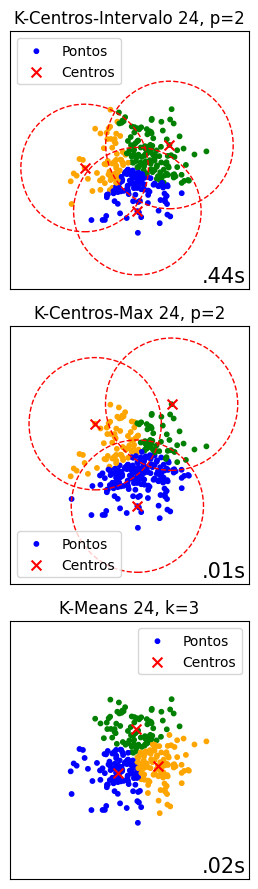


25
K-Centros-Intervalo
Raio Ótimo: 2.5629098095876657
Tempo de Execução: 0.4184584617614746 segundos

K-Centros-Max
Raio Ótimo: 2.5629098095876657
Tempo de Execução: 0.011921882629394531 segundos

K-Means
Raio Ótimo: 2.8289014151264458
Tempo de Execução: 0.016121864318847656 segundos
Silhueta: 0.348



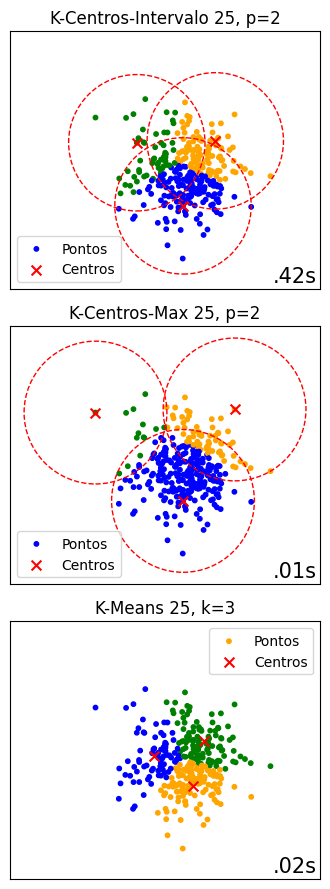


26
K-Centros-Intervalo
Raio Ótimo: 2.75742749888789
Tempo de Execução: 0.397625207901001 segundos

K-Centros-Max
Raio Ótimo: 2.75742749888789
Tempo de Execução: 0.018066883087158203 segundos

K-Means
Raio Ótimo: 2.911650877114217
Tempo de Execução: 0.01502227783203125 segundos
Silhueta: 0.345



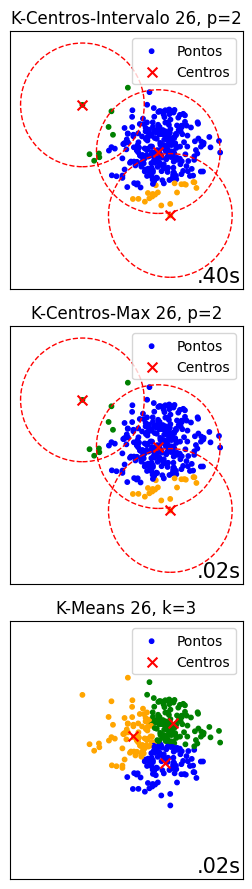


27
K-Centros-Intervalo
Raio Ótimo: 2.942651887873298
Tempo de Execução: 0.682502031326294 segundos

K-Centros-Max
Raio Ótimo: 2.942651887873298
Tempo de Execução: 0.02621173858642578 segundos

K-Means
Raio Ótimo: 3.4346057712389255
Tempo de Execução: 0.016314983367919922 segundos
Silhueta: 0.362



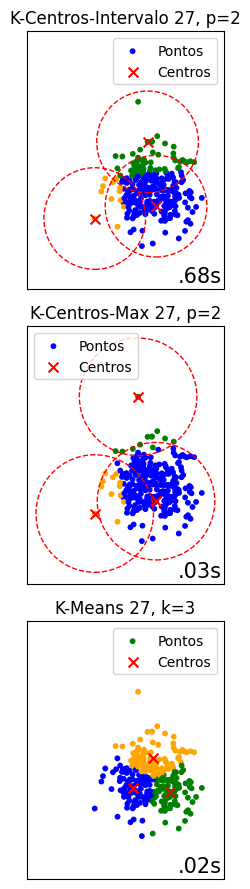


28
K-Centros-Intervalo
Raio Ótimo: 2.7197516791904848
Tempo de Execução: 0.6826071739196777 segundos

K-Centros-Max
Raio Ótimo: 2.7197516791904848
Tempo de Execução: 0.027102947235107422 segundos

K-Means
Raio Ótimo: 2.838604846404651
Tempo de Execução: 0.019352436065673828 segundos
Silhueta: 0.355



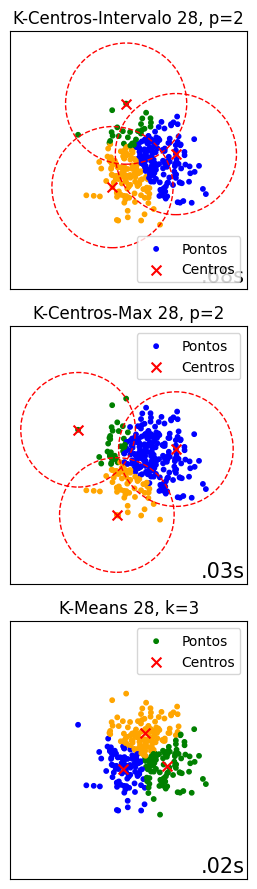


29
K-Centros-Intervalo
Raio Ótimo: 3.0504790909731088
Tempo de Execução: 0.5219442844390869 segundos

K-Centros-Max
Raio Ótimo: 3.0504790909731088
Tempo de Execução: 0.029317855834960938 segundos

K-Means
Raio Ótimo: 3.26597165334488
Tempo de Execução: 0.014601945877075195 segundos
Silhueta: 0.349



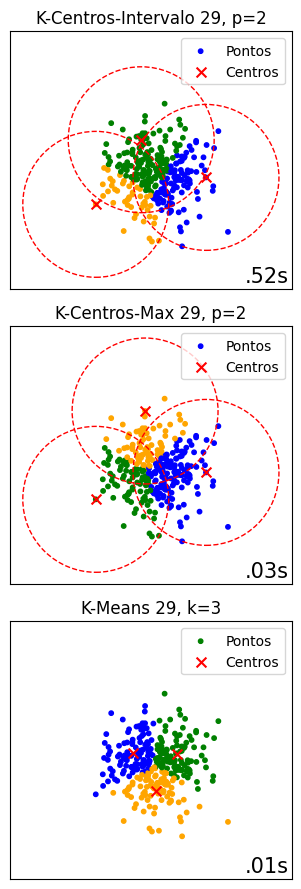


30
K-Centros-Intervalo
Raio Ótimo: 3.1112559847932904
Tempo de Execução: 0.43691039085388184 segundos

K-Centros-Max
Raio Ótimo: 3.1112559847932904
Tempo de Execução: 0.011881351470947266 segundos

K-Means
Raio Ótimo: 2.3787305750999117
Tempo de Execução: 0.015287399291992188 segundos
Silhueta: 0.342



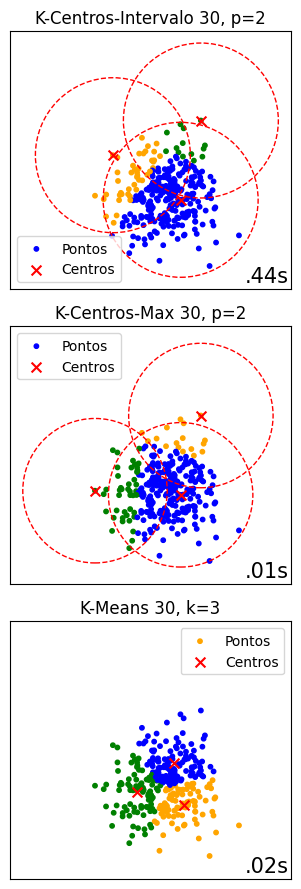

In [ ]:
for i_dataset, X in enumerate(datasets_list):
    # Assumindo que cada conjunto de dados é apenas um array X
    X = StandardScaler().fit_transform(X)
    print()
    print(i_dataset + 1)
    k = 3  # Definindo o valor de k
    fig, axes = plt.subplots(3, 1, figsize=(18, 9), sharex=True, sharey=True)
    plt.subplots_adjust(
        left=0.02, right=0.98, bottom=0.001, top=0.95, wspace=0.05, hspace=0.01
    )
    axes = axes.flatten()
    # Plotar para o algoritmo encontrar_raio_otimo, p = 2
    t0 = time.time()
    raio_otimo, centros_otimo = encontrar_raio_otimo(X, k)
    t1 = time.time()
    raio_maximo_otimo = calcular_raio_maximo(X, centros_otimo)
    plotar_pontos_centros(axes[0], X, centros_otimo, raio_maximo_otimo, k, f"K-Centros-Intervalo {i_dataset + 1}, p=2", t1 - t0)
    print("K-Centros-Intervalo")
    print("Raio Ótimo:", raio_otimo)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("")

    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dados Sintéticos {i_dataset + 1}',
        metodo='K-Centros-Intervalo P = 2',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    # Plotar para o algoritmo k_centros_max_dist, p = 2
    t0 = time.time()
    centros_k_centros = k_centros_max_dist(X, k)
    t1 = time.time()
    raio_maximo_k_centros = calcular_raio_maximo(X, centros_k_centros)
    plotar_pontos_centros(axes[1], X, centros_k_centros, raio_maximo_k_centros, k, f"K-Centros-Max {i_dataset + 1}, p=2", t1 - t0)
    print("K-Centros-Max")
    print("Raio Ótimo:", raio_otimo)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("")

    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dados Sintéticos {i_dataset + 1}',
        metodo='K-Centros-Max P = 2',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    # Plotar a execução do K-Means
    seed = numero_aleatorio = random.randint(1, 100)
    t0 = time.time()
    kmeans = KMeans(n_clusters=k, random_state=seed, n_init=10)
    clusters = kmeans.fit_predict(X)
    centros_kmeans = kmeans.cluster_centers_
    t1 = time.time()
    raio_maximo_k_means = calcular_raio_maximo(X, centros_kmeans)
    plotar_pontos_centros(axes[2], X, centros_kmeans, raio_maximo_k_means, k, f"K-Means {i_dataset + 1}, k={k}", t1 - t0, k_means = True)
    print("K-Means")
    print("Raio Ótimo:", raio_maximo_k_means)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("Silhueta:", round(silhouette_score(X, clusters), 3))
    print("")

    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dados Sintéticos {i_dataset + 1}',
        metodo='K-Means',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    plt.tight_layout()
    plt.show()

## Testes com K = 3 e P = 1


1
K-Centros-Intervalo
Raio Ótimo: 3.9471243778833363
Tempo de Execução: 0.4120938777923584 segundos

K-Centros-Max
Raio Ótimo: 3.9471243778833363
Tempo de Execução: 0.011886119842529297 segundos

K-Means
Raio Ótimo: 3.0338014417637464
Tempo de Execução: 0.026009082794189453 segundos
Silhueta: 0.356



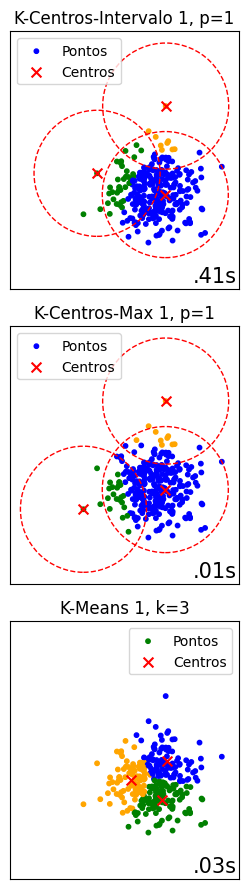


2
K-Centros-Intervalo
Raio Ótimo: 3.4880967759488266
Tempo de Execução: 0.42709803581237793 segundos

K-Centros-Max
Raio Ótimo: 3.4880967759488266
Tempo de Execução: 0.011836767196655273 segundos

K-Means
Raio Ótimo: 2.53054714956912
Tempo de Execução: 0.014734983444213867 segundos
Silhueta: 0.339



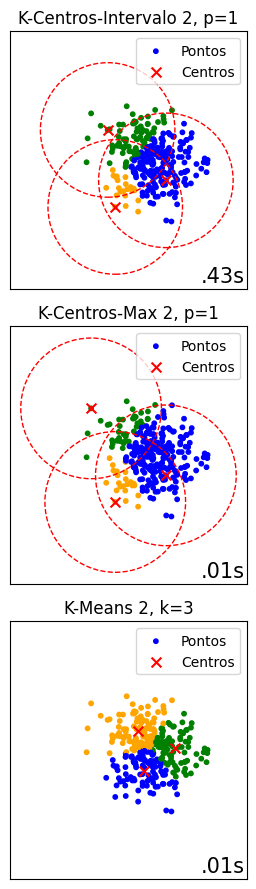


3
K-Centros-Intervalo
Raio Ótimo: 3.7312505804657494
Tempo de Execução: 0.42113327980041504 segundos

K-Centros-Max
Raio Ótimo: 3.7312505804657494
Tempo de Execução: 0.011920928955078125 segundos

K-Means
Raio Ótimo: 2.406000516042025
Tempo de Execução: 0.013150215148925781 segundos
Silhueta: 0.342



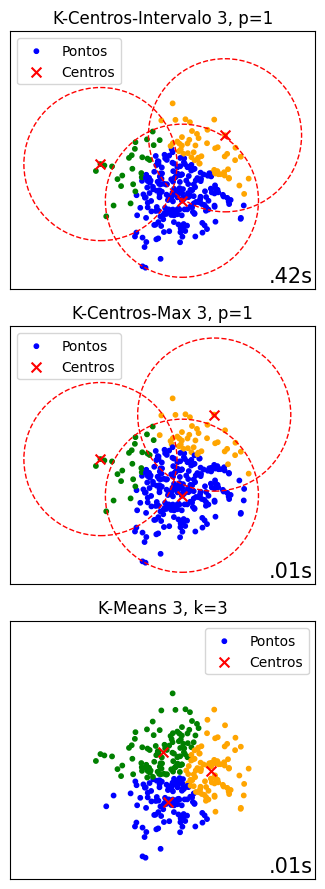


4
K-Centros-Intervalo
Raio Ótimo: 3.8765388777588186
Tempo de Execução: 0.3978745937347412 segundos

K-Centros-Max
Raio Ótimo: 3.8765388777588186
Tempo de Execução: 0.011913299560546875 segundos

K-Means
Raio Ótimo: 3.206684147674365
Tempo de Execução: 0.013588905334472656 segundos
Silhueta: 0.331



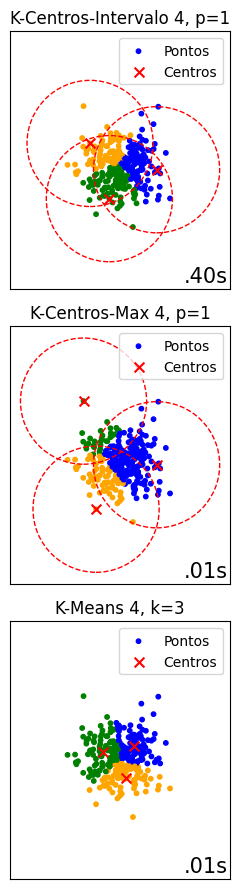


5
K-Centros-Intervalo
Raio Ótimo: 3.8822557258714956
Tempo de Execução: 0.47781920433044434 segundos

K-Centros-Max
Raio Ótimo: 3.8822557258714956
Tempo de Execução: 0.011822938919067383 segundos

K-Means
Raio Ótimo: 2.8054063330743104
Tempo de Execução: 0.0124359130859375 segundos
Silhueta: 0.353



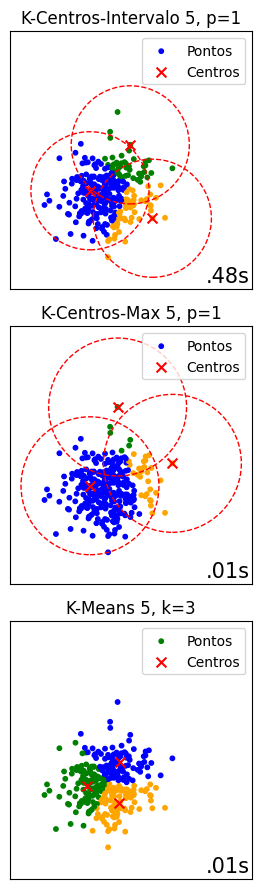


6
K-Centros-Intervalo
Raio Ótimo: 3.547878432319989
Tempo de Execução: 0.39453649520874023 segundos

K-Centros-Max
Raio Ótimo: 3.547878432319989
Tempo de Execução: 0.011914491653442383 segundos

K-Means
Raio Ótimo: 2.51878060053945
Tempo de Execução: 0.013748407363891602 segundos
Silhueta: 0.344



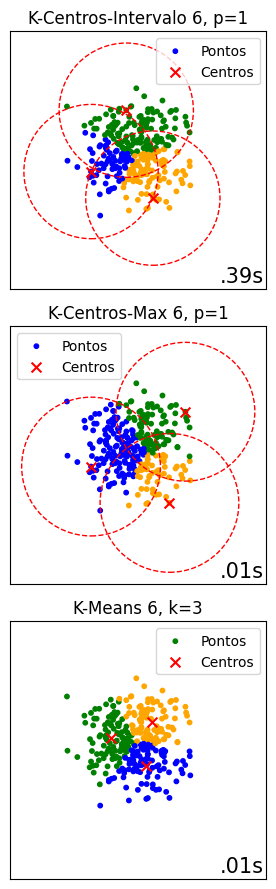


7
K-Centros-Intervalo
Raio Ótimo: 3.8741605570365776
Tempo de Execução: 0.4314463138580322 segundos

K-Centros-Max
Raio Ótimo: 3.8741605570365776
Tempo de Execução: 0.011765003204345703 segundos

K-Means
Raio Ótimo: 3.4247191261705616
Tempo de Execução: 0.014081954956054688 segundos
Silhueta: 0.335



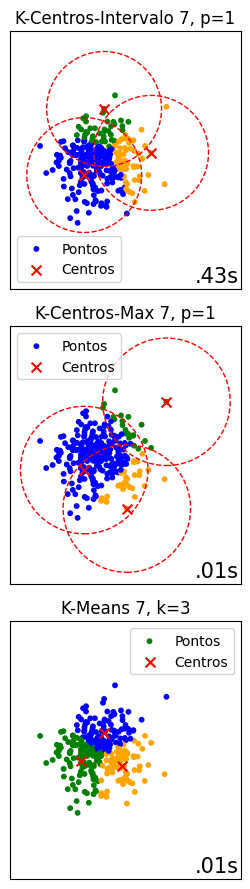


8
K-Centros-Intervalo
Raio Ótimo: 4.029430588774274
Tempo de Execução: 0.5764706134796143 segundos

K-Centros-Max
Raio Ótimo: 4.029430588774274
Tempo de Execução: 0.014480113983154297 segundos

K-Means
Raio Ótimo: 2.695687121199278
Tempo de Execução: 0.019058704376220703 segundos
Silhueta: 0.369



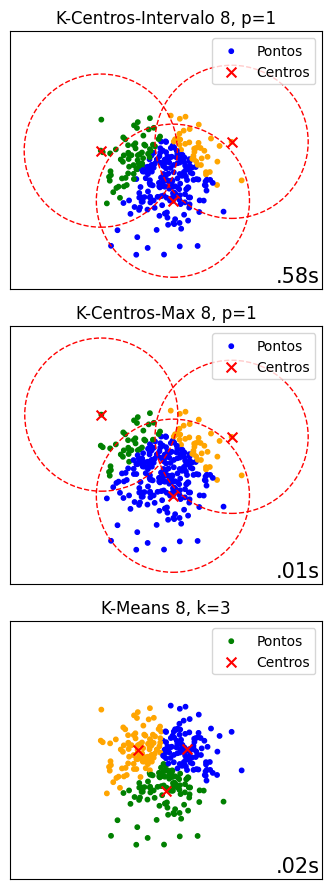


9
K-Centros-Intervalo
Raio Ótimo: 4.036698556355257
Tempo de Execução: 0.6556739807128906 segundos

K-Centros-Max
Raio Ótimo: 4.036698556355257
Tempo de Execução: 0.02481698989868164 segundos

K-Means
Raio Ótimo: 2.913068732882366
Tempo de Execução: 0.021828889846801758 segundos
Silhueta: 0.33



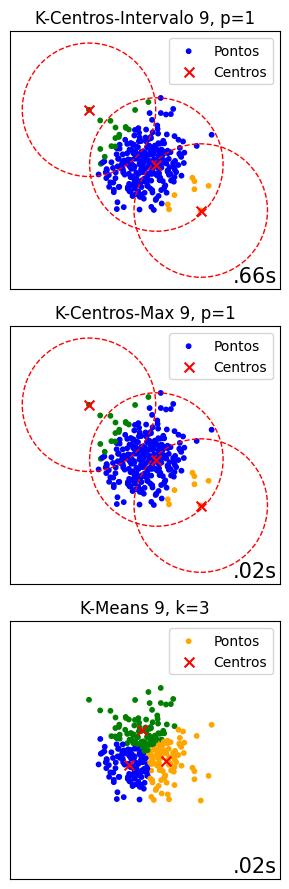


10
K-Centros-Intervalo
Raio Ótimo: 3.4087700274283854
Tempo de Execução: 0.7477312088012695 segundos

K-Centros-Max
Raio Ótimo: 3.4087700274283854
Tempo de Execução: 0.02498173713684082 segundos

K-Means
Raio Ótimo: 2.179910466085123
Tempo de Execução: 0.01970052719116211 segundos
Silhueta: 0.339



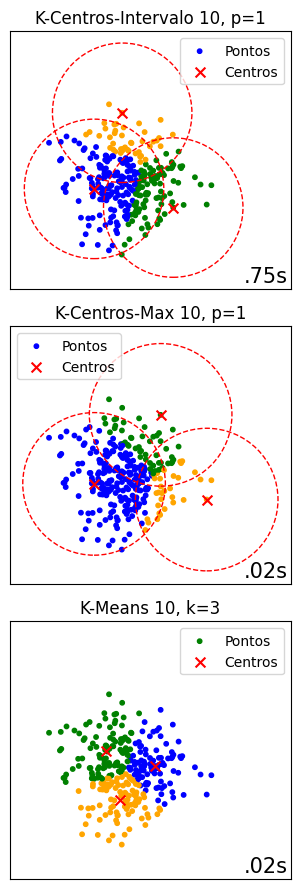


11
K-Centros-Intervalo
Raio Ótimo: 3.482512188201774
Tempo de Execução: 0.39855194091796875 segundos

K-Centros-Max
Raio Ótimo: 3.482512188201774
Tempo de Execução: 0.011838436126708984 segundos

K-Means
Raio Ótimo: 2.2400625438345023
Tempo de Execução: 0.01286458969116211 segundos
Silhueta: 0.36



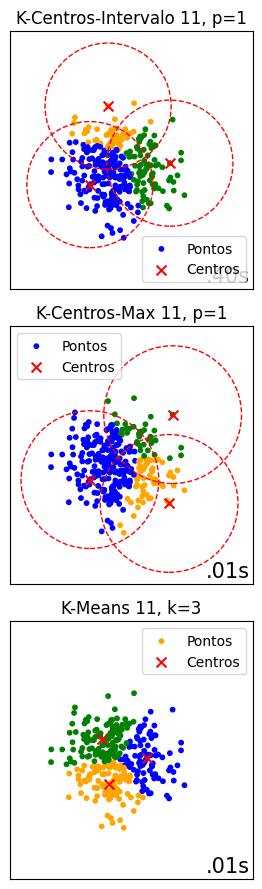


12
K-Centros-Intervalo
Raio Ótimo: 3.806674034329151
Tempo de Execução: 0.39652276039123535 segundos

K-Centros-Max
Raio Ótimo: 3.806674034329151
Tempo de Execução: 0.011812448501586914 segundos

K-Means
Raio Ótimo: 2.9607057490344704
Tempo de Execução: 0.01246786117553711 segundos
Silhueta: 0.328



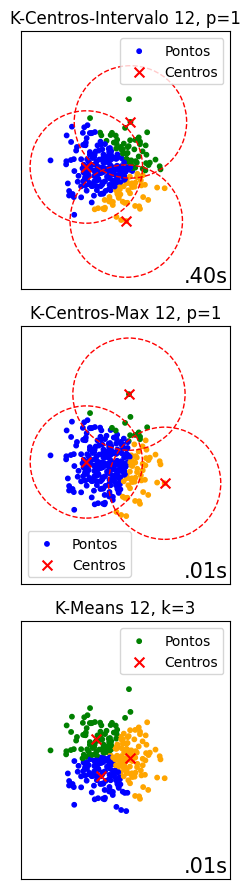


13
K-Centros-Intervalo
Raio Ótimo: 3.809150144169241
Tempo de Execução: 0.39365696907043457 segundos

K-Centros-Max
Raio Ótimo: 3.809150144169241
Tempo de Execução: 0.017143964767456055 segundos

K-Means
Raio Ótimo: 2.797662585075742
Tempo de Execução: 0.019931554794311523 segundos
Silhueta: 0.358



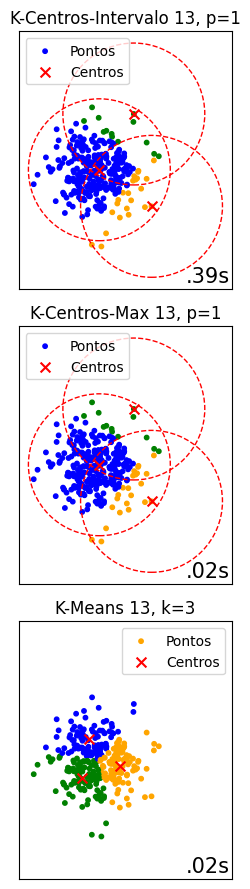


14
K-Centros-Intervalo
Raio Ótimo: 3.7638601051756324
Tempo de Execução: 0.46373414993286133 segundos

K-Centros-Max
Raio Ótimo: 3.7638601051756324
Tempo de Execução: 0.012107133865356445 segundos

K-Means
Raio Ótimo: 2.836243883023095
Tempo de Execução: 0.012680530548095703 segundos
Silhueta: 0.342



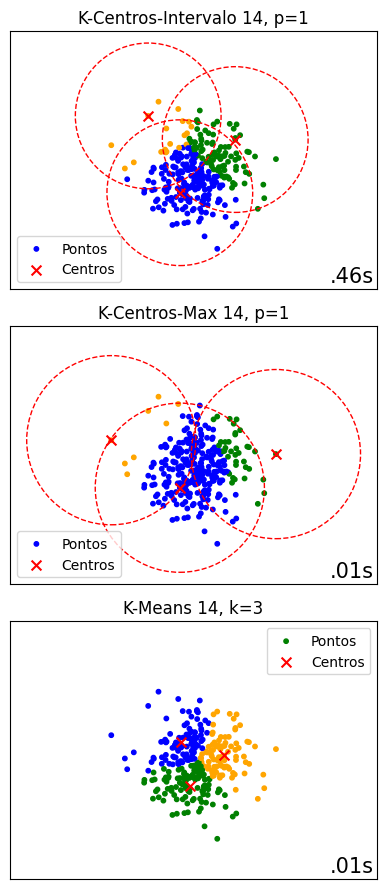


15
K-Centros-Intervalo
Raio Ótimo: 3.2296188783192754
Tempo de Execução: 0.4099249839782715 segundos

K-Centros-Max
Raio Ótimo: 3.2296188783192754
Tempo de Execução: 0.011794090270996094 segundos

K-Means
Raio Ótimo: 2.6708003960755455
Tempo de Execução: 0.015037298202514648 segundos
Silhueta: 0.343



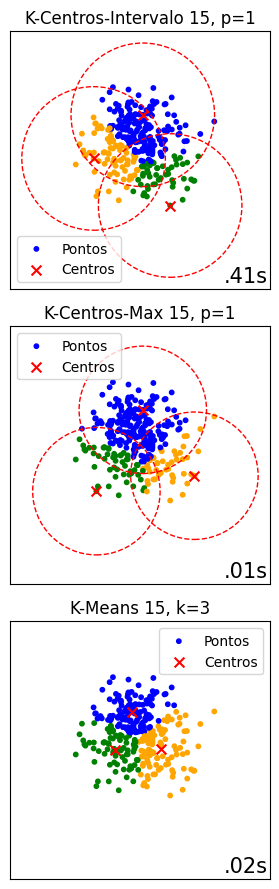


16
K-Centros-Intervalo
Raio Ótimo: 3.422925456172784
Tempo de Execução: 0.43593621253967285 segundos

K-Centros-Max
Raio Ótimo: 3.422925456172784
Tempo de Execução: 0.011801719665527344 segundos

K-Means
Raio Ótimo: 2.3755241636356157
Tempo de Execução: 0.01972198486328125 segundos
Silhueta: 0.337



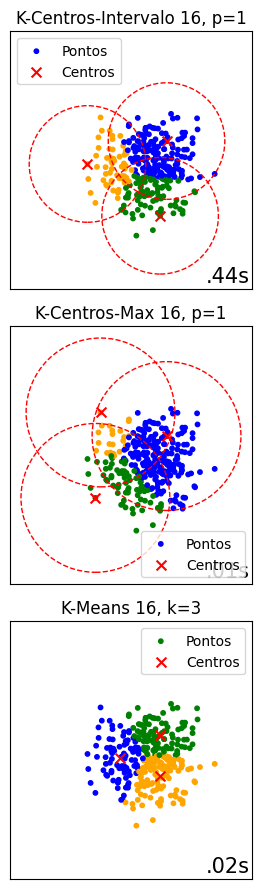


17
K-Centros-Intervalo
Raio Ótimo: 3.3337040009337606
Tempo de Execução: 0.46450281143188477 segundos

K-Centros-Max
Raio Ótimo: 3.3337040009337606
Tempo de Execução: 0.015834808349609375 segundos

K-Means
Raio Ótimo: 2.9531898980535405
Tempo de Execução: 0.017957210540771484 segundos
Silhueta: 0.336



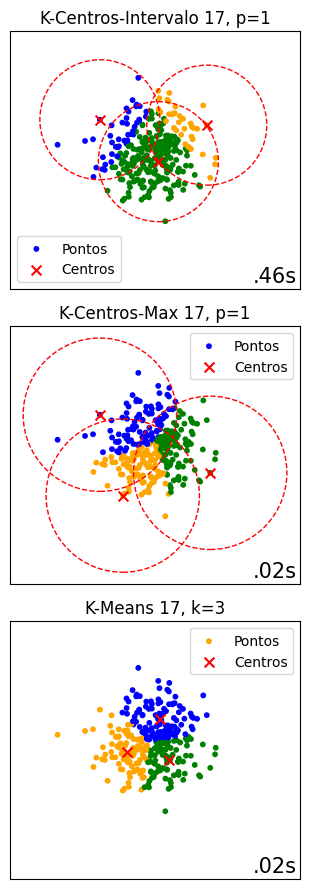


18
K-Centros-Intervalo
Raio Ótimo: 3.698467431322583
Tempo de Execução: 0.4269747734069824 segundos

K-Centros-Max
Raio Ótimo: 3.698467431322583
Tempo de Execução: 0.02004265785217285 segundos

K-Means
Raio Ótimo: 2.7488249722941216
Tempo de Execução: 0.013169050216674805 segundos
Silhueta: 0.349



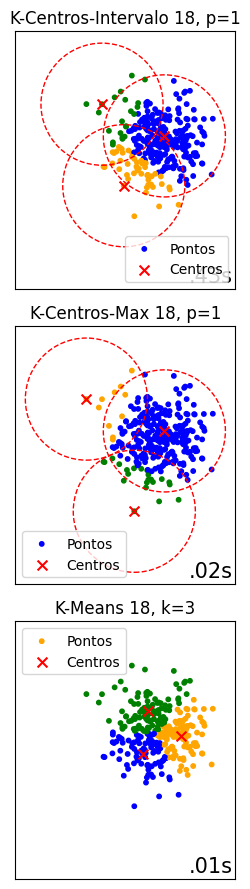


19
K-Centros-Intervalo
Raio Ótimo: 4.435820502445757
Tempo de Execução: 0.4506218433380127 segundos

K-Centros-Max
Raio Ótimo: 4.435820502445757
Tempo de Execução: 0.02607274055480957 segundos

K-Means
Raio Ótimo: 2.8533482108816854
Tempo de Execução: 0.02315521240234375 segundos
Silhueta: 0.357



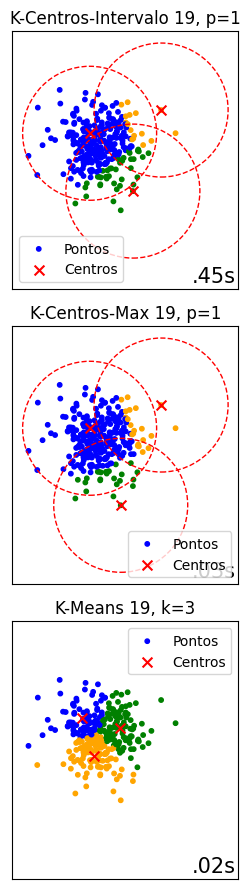


20
K-Centros-Intervalo
Raio Ótimo: 3.759924969860597
Tempo de Execução: 0.6433563232421875 segundos

K-Centros-Max
Raio Ótimo: 3.759924969860597
Tempo de Execução: 0.011391639709472656 segundos

K-Means
Raio Ótimo: 2.8594166736463054
Tempo de Execução: 0.02313375473022461 segundos
Silhueta: 0.351



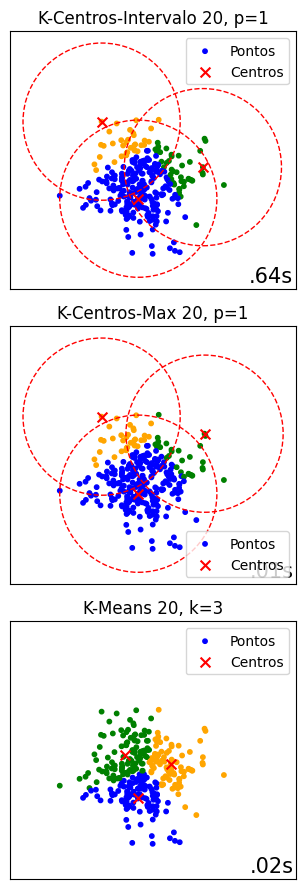


21
K-Centros-Intervalo
Raio Ótimo: 4.105872875670297
Tempo de Execução: 0.6767165660858154 segundos

K-Centros-Max
Raio Ótimo: 4.105872875670297
Tempo de Execução: 0.02523064613342285 segundos

K-Means
Raio Ótimo: 2.654807670111976
Tempo de Execução: 0.016433238983154297 segundos
Silhueta: 0.335



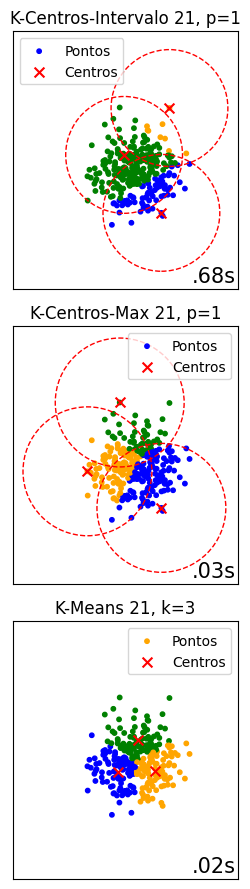


22
K-Centros-Intervalo
Raio Ótimo: 3.644190689528541
Tempo de Execução: 0.4567282199859619 segundos

K-Centros-Max
Raio Ótimo: 3.644190689528541
Tempo de Execução: 0.011958599090576172 segundos

K-Means
Raio Ótimo: 2.7745324580392046
Tempo de Execução: 0.014988183975219727 segundos
Silhueta: 0.335



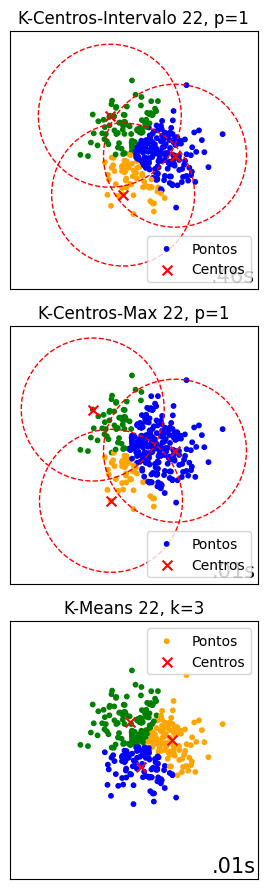


23
K-Centros-Intervalo
Raio Ótimo: 4.0986641516822315
Tempo de Execução: 0.42977261543273926 segundos

K-Centros-Max
Raio Ótimo: 4.0986641516822315
Tempo de Execução: 0.011757373809814453 segundos

K-Means
Raio Ótimo: 3.060474470804228
Tempo de Execução: 0.019140005111694336 segundos
Silhueta: 0.376



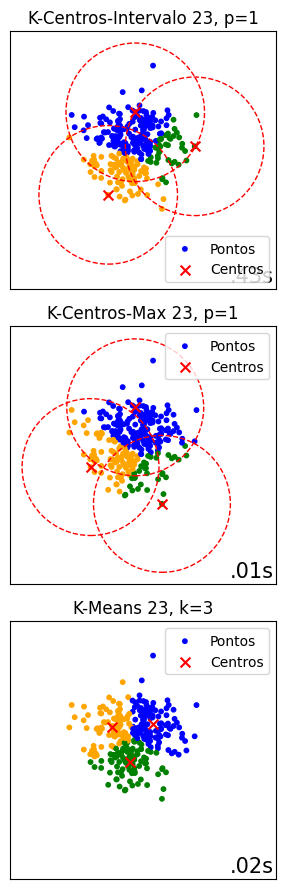


24
K-Centros-Intervalo
Raio Ótimo: 3.5934317863264695
Tempo de Execução: 0.6623592376708984 segundos

K-Centros-Max
Raio Ótimo: 3.5934317863264695
Tempo de Execução: 0.02023768424987793 segundos

K-Means
Raio Ótimo: 2.3073539022396887
Tempo de Execução: 0.01871037483215332 segundos
Silhueta: 0.348



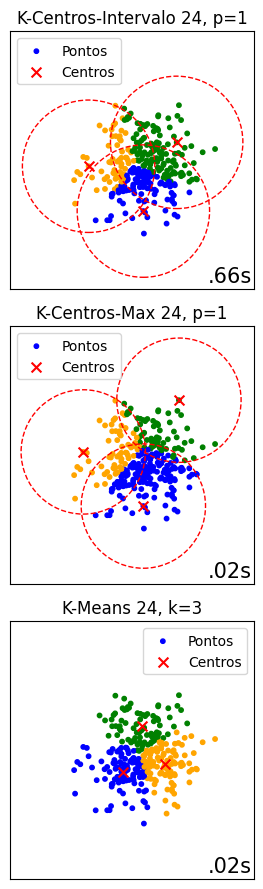


25
K-Centros-Intervalo
Raio Ótimo: 3.191553080187293
Tempo de Execução: 0.6689684391021729 segundos

K-Centros-Max
Raio Ótimo: 3.191553080187293
Tempo de Execução: 0.02535271644592285 segundos

K-Means
Raio Ótimo: 2.8289014151264458
Tempo de Execução: 0.019387483596801758 segundos
Silhueta: 0.348



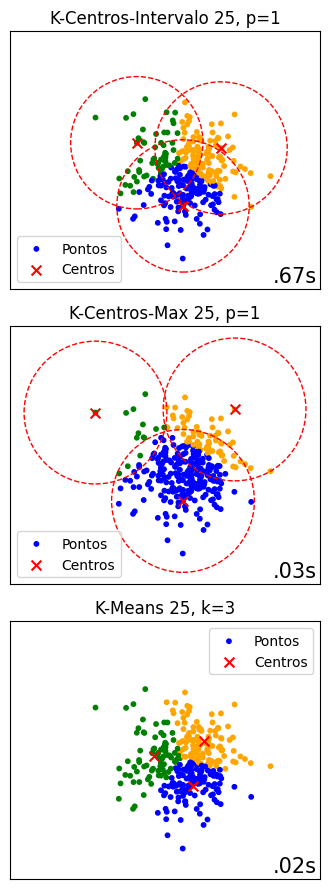


26
K-Centros-Intervalo
Raio Ótimo: 3.180625149210864
Tempo de Execução: 0.5884439945220947 segundos

K-Centros-Max
Raio Ótimo: 3.180625149210864
Tempo de Execução: 0.011754751205444336 segundos

K-Means
Raio Ótimo: 2.9154509651520617
Tempo de Execução: 0.016607284545898438 segundos
Silhueta: 0.345



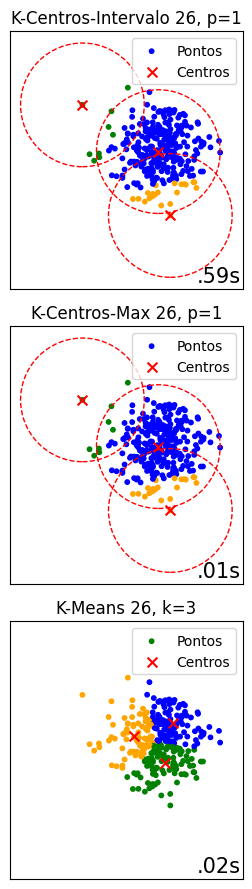


27
K-Centros-Intervalo
Raio Ótimo: 3.9678454900618982
Tempo de Execução: 0.4772777557373047 segundos

K-Centros-Max
Raio Ótimo: 3.9678454900618982
Tempo de Execução: 0.011896371841430664 segundos

K-Means
Raio Ótimo: 3.445322170730077
Tempo de Execução: 0.01929759979248047 segundos
Silhueta: 0.362



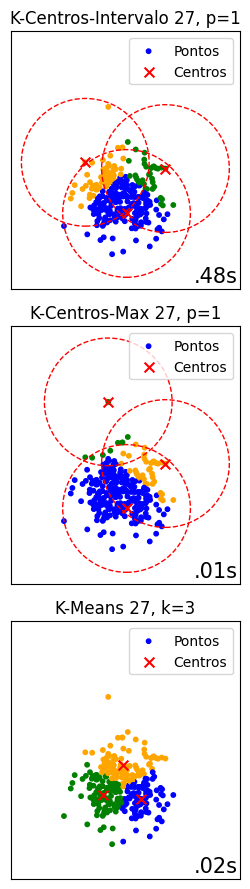


28
K-Centros-Intervalo
Raio Ótimo: 3.8186798277400653
Tempo de Execução: 0.40442824363708496 segundos

K-Centros-Max
Raio Ótimo: 3.8186798277400653
Tempo de Execução: 0.011774301528930664 segundos

K-Means
Raio Ótimo: 2.906070620649665
Tempo de Execução: 0.013556241989135742 segundos
Silhueta: 0.353



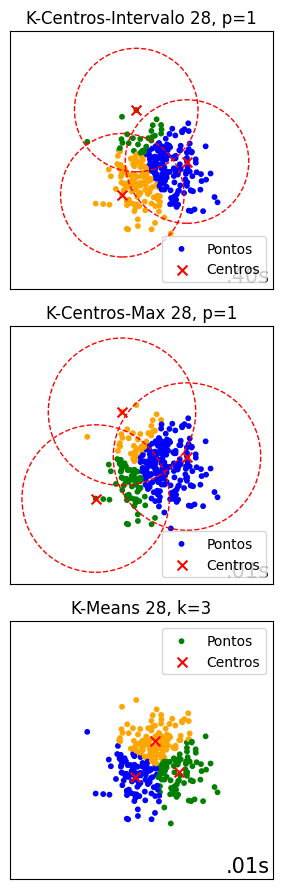


29
K-Centros-Intervalo
Raio Ótimo: 4.676684854180478
Tempo de Execução: 0.659935712814331 segundos

K-Centros-Max
Raio Ótimo: 4.676684854180478
Tempo de Execução: 0.023728132247924805 segundos

K-Means
Raio Ótimo: 3.26597165334488
Tempo de Execução: 0.019875526428222656 segundos
Silhueta: 0.349



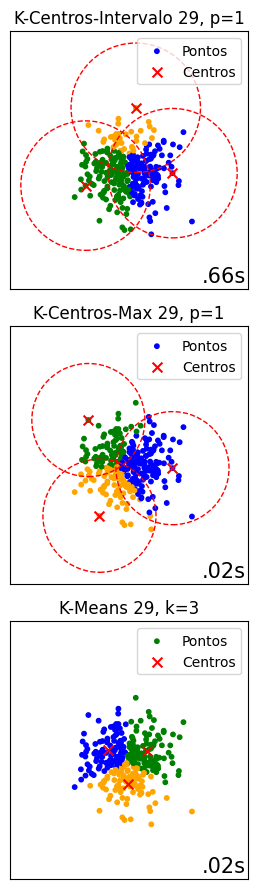


30
K-Centros-Intervalo
Raio Ótimo: 3.995780722039802
Tempo de Execução: 0.7248516082763672 segundos

K-Centros-Max
Raio Ótimo: 3.995780722039802
Tempo de Execução: 0.024109840393066406 segundos

K-Means
Raio Ótimo: 2.3787305750999117
Tempo de Execução: 0.021445751190185547 segundos
Silhueta: 0.342



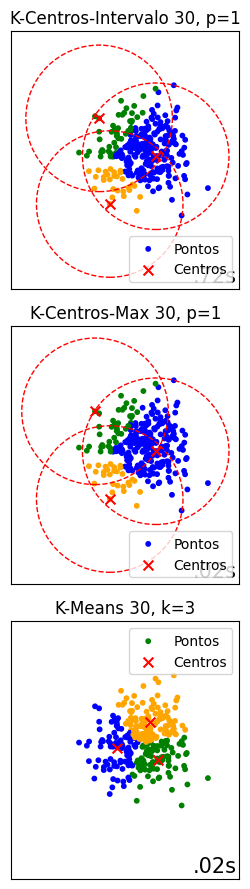

In [ ]:
for i_dataset, X in enumerate(datasets_list):
    # Assumindo que cada conjunto de dados é apenas um array X
    X = StandardScaler().fit_transform(X)
    print()
    print(i_dataset + 1)
    k = 3  # Definindo o valor de k
    fig, axes = plt.subplots(3, 1, figsize=(18, 9), sharex=True, sharey=True)
    plt.subplots_adjust(
        left=0.02, right=0.98, bottom=0.001, top=0.95, wspace=0.05, hspace=0.01
    )
    axes = axes.flatten()

    # Plotar para o algoritmo encontrar_raio_otimo, p = 1
    t0 = time.time()
    raio_otimo, centros_otimo = encontrar_raio_otimo(X, k, 1)
    t1 = time.time()
    raio_maximo_otimo = calcular_raio_maximo(X, centros_otimo)
    plotar_pontos_centros(axes[0], X, centros_otimo, raio_maximo_otimo, k, f"K-Centros-Intervalo {i_dataset + 1}, p=1", t1 - t0)
    print("K-Centros-Intervalo")
    print("Raio Ótimo:", raio_otimo)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("")

    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dados Sintéticos {i_dataset + 1}',
        metodo='K-Centros-Intervalo P = 1',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    # Plotar para o algoritmo k_centros_max_dist, p = 1
    t0 = time.time()
    centros_k_centros = k_centros_max_dist(X, k, 1)
    t1 = time.time()
    raio_maximo_k_centros = calcular_raio_maximo(X, centros_k_centros)
    plotar_pontos_centros(axes[1], X, centros_k_centros, raio_maximo_k_centros, k, f"K-Centros-Max {i_dataset + 1}, p=1", t1 - t0)
    print("K-Centros-Max")
    print("Raio Ótimo:", raio_otimo)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("")
    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dados Sintéticos {i_dataset + 1}',
        metodo='K-Centros-Max P = 1',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    # Plotar a execução do K-Means
    seed = numero_aleatorio = random.randint(1, 100)
    t0 = time.time()
    kmeans = KMeans(n_clusters=k, random_state=seed, n_init=10)
    clusters = kmeans.fit_predict(X)
    centros_kmeans = kmeans.cluster_centers_
    t1 = time.time()
    raio_maximo_k_means = calcular_raio_maximo(X, centros_kmeans)
    plotar_pontos_centros(axes[2], X, centros_kmeans, raio_maximo_k_means, k, f"K-Means {i_dataset + 1}, k={k}", t1 - t0, k_means = True)
    print("K-Means")
    print("Raio Ótimo:", raio_maximo_k_means)
    print("Tempo de Execução:", t1-t0,"segundos")
    print("Silhueta:", round(silhouette_score(X, clusters), 3))
    print("")

    plt.tight_layout()
    plt.show()

# To Do List:

O que fazer ainda?

- Usar a biblioteca sklearn para extrair o índice de Rand e silhueta de cada instância.
- Agregar os dados (valor ótimo, silhueta, Rand, parâmetro de largura do algoritmo e tempo de execução) em tabelas, com as médias e desvios-padrões.
- Introduzir o problema, descrever os métodos (busca por raio ótimo e distância máxima) e métricas (Minkowski com p=1 e p=2) usados, a implementação, os experimentos (incluindo a base de dados), e analisar as tabelas em um relatório com no máximo 12 páginas. [Esta parte eu resolvo sozinho, foque no resto]
- Repetir os algoritmos com K-Means

Idealmente, terminaremos na sexta e retocaremos no sábado para enviar, para que tenhamos tempo de estudar para as provas de PO e LP na terça e na quarta. Aliás, me confirme depois se LP é quarta mesmo.

Desvio Padrão e Parâmetro de Largura para K-Centros Max

Completado:

- Tempo de Execução
- métricas de rand e silhueta
- K-Means
- Extrair e usar dados do repositório instalado.

# UCI Datasets

## Código

In [ ]:
import random
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, silhouette_score
import time
import matplotlib.pyplot as plt
from ucimlrepo import fetch_ucirepo, list_available_datasets

def processar_e_plotar(X, var_x_name, var_y_name, title, a_tabela, n, k=3, p=1, sol=None):
    """
    Função que recebe uma lista de pontos X, os nomes das variáveis para os eixos X e Y,
    o título do gráfico, e o número de centros k. Realiza a análise com o método de K-Centros,
    K-Centros-Max e K-Means, e plota os resultados. Calcula também as métricas de Rand e Silhueta.

    Args:
        X (list of tuples): Lista de pontos onde cada ponto é uma tupla (var_x, var_y).
        var_x_name (str): Nome da variável para o eixo X.
        var_y_name (str): Nome da variável para o eixo Y.
        title (str): Título do gráfico.
        k (int): Número de centros a serem encontrados.
        sol (list): Lista opcional de etiquetas reais para calcular métricas de Rand e Silhueta.
    """

    # Configuração inicial para K-Means
    raios_otimos = []
    rand_scores = []
    silhouette_scores = []
    tempo = 0

    for i in range(30):
        seed = random.randint(1, 100)
        t0 = time.time()
        kmeans = KMeans(n_clusters=k, random_state=seed, n_init=10)
        clusters = kmeans.fit_predict(X)
        centros_kmeans = kmeans.cluster_centers_
        t1 = time.time()
        tempo += t1 - t0
        raio_maximo_k_means = calcular_raio_maximo(X, centros_kmeans)
        raios_otimos.append(raio_maximo_k_means)

        if sol is not None:
            rand_score, silhouette_score_value = calcular_metricas(clusters, X, sol)
            rand_scores.append(rand_score)
            silhouette_scores.append(silhouette_score_value)

    raio_medio = sum(raios_otimos) / len(raios_otimos)
    desvio_padrao_raio = np.std(raios_otimos)

    print("K-Means")
    print(f"Média do Raio Ótimo: {round(raio_medio,3)}")
    print(f"Desvio Padrão do Raio Ótimo: {round(desvio_padrao_raio, 3)}")
    print("Tempo:", round((tempo/30), 3))

    if sol is not None:
        print(f"Média Rand Index: {round((sum(rand_scores) / len(rand_scores)), 3)}")
        print(f"Média Silhueta: {round((sum(silhouette_scores) / len(silhouette_scores)), 3)}")
    print()

    if p == 1:
      a_tabela = adicionar_na_tabela(
          tabela= a_tabela,
          descricao=f'Dados Empíricos {n}',
          metodo=f'K-Means',
          raio= raio_medio,
          tempo_execucao=t1-t0,
          valor_k= k,
          desvio= desvio_padrao_raio,
          largura= 0,
          rand= sum(rand_scores) / len(rand_scores),
          silhueta= sum(silhouette_scores) / len(silhouette_scores)
      )

    var_x, var_y = zip(*X)

    fig, axes = plt.subplots(1, 3, figsize=(22, 5), sharex=True, sharey=True)

    # Cálculo e plotagem para o raio ótimo, p = 1
    t0 = time.time()
    raio_otimo, centros_otimo = encontrar_raio_otimo(X, k, p)
    clusters_otimo = atribuir_clusters(X, centros_otimo, p)
    t1 = time.time()
    tempo = t1 - t0
    raio_maximo_otimo = calcular_raio_maximo(X, centros_otimo)
    plotar_pontos_centros(axes[0], X, centros_otimo, raio_maximo_otimo, k, f"K-Centros-Intervalo, p={p} e k={k}", tempo)

    print("K-Centros-Intervalo")
    print("Raio Ótimo:", round(raio_otimo, 3))
    print(f"Desvio Padrão do Raio Ótimo: 0")
    print("Tempo:", round(tempo, 3))
    calcular_metricas(clusters_otimo, X, sol, imprimir=True)
    print()
    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dados Empíricos {n}',
        metodo=f'K-Centros-Intervalo P = {p}',
        raio= raio_otimo,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    # Plotar para o algoritmo k_centros_max_dist, p = 1
    t0 = time.time()
    centros_k_centros = k_centros_max_dist(X, k, p)
    clusters_k_centros = atribuir_clusters(X, centros_otimo, p)
    t1 = time.time()
    tempo = t1 - t0
    raio_maximo_k_centros = calcular_raio_maximo(X, centros_k_centros)
    plotar_pontos_centros(axes[1], X, centros_k_centros, raio_maximo_k_centros, k, f"K-Centros-Max, p={p} e k={k}", tempo)

    print("K-Centros-Max")
    print("Raio Ótimo:", round(raio_maximo_k_centros, 3))
    print(f"Desvio Padrão do Raio Ótimo: 0")
    print("Tempo:", round(tempo, 3))
    calcular_metricas(clusters_k_centros, X, sol, imprimir=True)
    print()

    a_tabela = adicionar_na_tabela(
        tabela= a_tabela,
        descricao=f'Dados Empíricos {n}',
        metodo=f'K-Centros-Max P = {p}',
        raio= raio_maximo_k_centros,
        tempo_execucao=t1-t0,
        valor_k= k,
        desvio= 0,
        largura= 0
    )

    # Plotar a execução do K-Means
    seed = random.randint(1, 100)
    t0 = time.time()
    kmeans = KMeans(n_clusters=k, random_state=seed, n_init=10)
    clusters = kmeans.fit_predict(X)
    centros_kmeans = kmeans.cluster_centers_
    t1 = time.time()
    tempo = t1 - t0
    raio_maximo_k_means = calcular_raio_maximo(X, centros_kmeans)
    plotar_pontos_centros(axes[2], X, centros_kmeans, raio_maximo_k_means, k, f"K-Means, k={k}", tempo, k_means = True)
    print()

    plt.show()
    return a_tabela

## Datasets para Teste

K-Means
Média do Raio Ótimo: 15.75
Desvio Padrão do Raio Ótimo: 0.0
Tempo: 0.026
Média Rand Index: 0.136
Média Silhueta: 0.548

K-Centros-Intervalo
Raio Ótimo: 7.411
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.076
Rand Index: 0.209
Silhueta: 0.503

K-Centros-Max
Raio Ótimo: 6.484
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.135
Rand Index: 0.209
Silhueta: 0.503




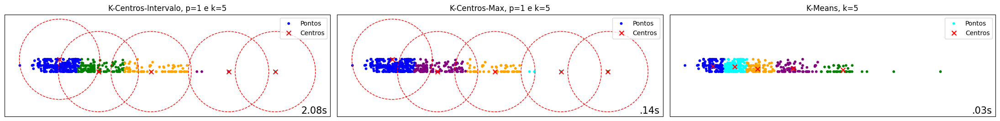

K-Means
Média do Raio Ótimo: 15.75
Desvio Padrão do Raio Ótimo: 0.0
Tempo: 0.028
Média Rand Index: 0.136
Média Silhueta: 0.548

K-Centros-Intervalo
Raio Ótimo: 6.588
Desvio Padrão do Raio Ótimo: 0
Tempo: 3.449
Rand Index: 0.26
Silhueta: 0.56

K-Centros-Max
Raio Ótimo: 6.484
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.143
Rand Index: 0.26
Silhueta: 0.56




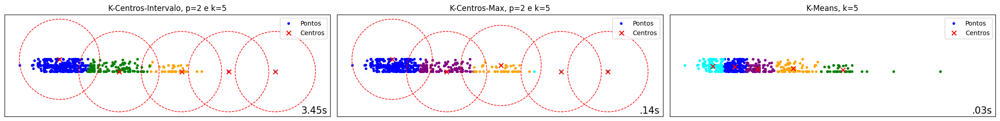

In [ ]:
estimation_of_obesity_levels_based_on_eating_habits_and_physical_condition = fetch_ucirepo(id=544)
X_df = estimation_of_obesity_levels_based_on_eating_habits_and_physical_condition.data.features

sampled_df = X_df[['Age', 'TUE','MTRANS']].sample(n=700, random_state=42)

Age = sampled_df['Age']
TUE = sampled_df['TUE']
X = list(zip(Age, TUE))

num_k = len(sampled_df['MTRANS'].unique())

a_tabela = processar_e_plotar(X, var_x_name='Age', var_y_name='Time using technology devices (TUE)', title='Relação entre Age e TUE', k=num_k, p=1, sol=sampled_df['MTRANS'], a_tabela=a_tabela, n= 1)
a_tabela = processar_e_plotar(X, var_x_name='Age', var_y_name='Time using technology devices (TUE)', title='Relação entre Age e TUE', k=num_k, p=2, sol=sampled_df['MTRANS'], a_tabela=a_tabela, n= 1)

K-Means
Média do Raio Ótimo: 2720.592
Desvio Padrão do Raio Ótimo: 335.594
Tempo: 0.021
Média Rand Index: 0.039
Média Silhueta: 0.801

K-Centros-Intervalo
Raio Ótimo: 2778.005
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.868
Rand Index: 0.022
Silhueta: 0.774

K-Centros-Max
Raio Ótimo: 2711.828
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.119
Rand Index: 0.022
Silhueta: 0.774




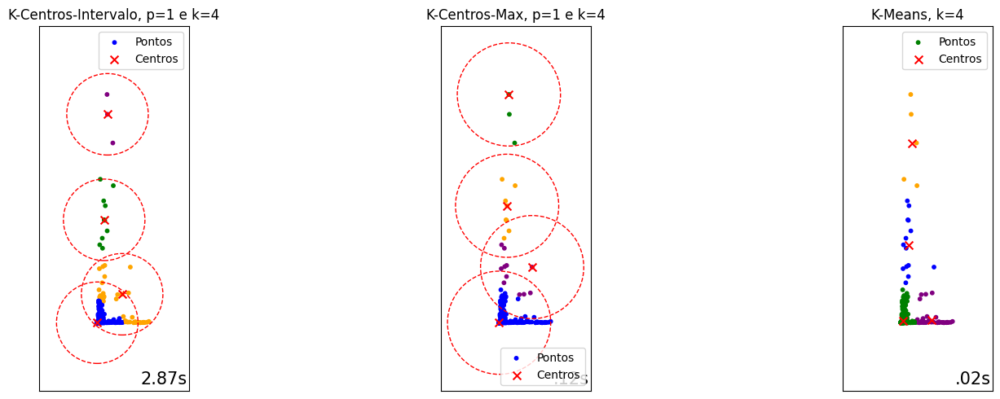

K-Means
Média do Raio Ótimo: 2630.543
Desvio Padrão do Raio Ótimo: 224.623
Tempo: 0.035
Média Rand Index: 0.038
Média Silhueta: 0.801

K-Centros-Intervalo
Raio Ótimo: 2711.831
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.577
Rand Index: 0.014
Silhueta: 0.813

K-Centros-Max
Raio Ótimo: 2711.828
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.111
Rand Index: 0.014
Silhueta: 0.813




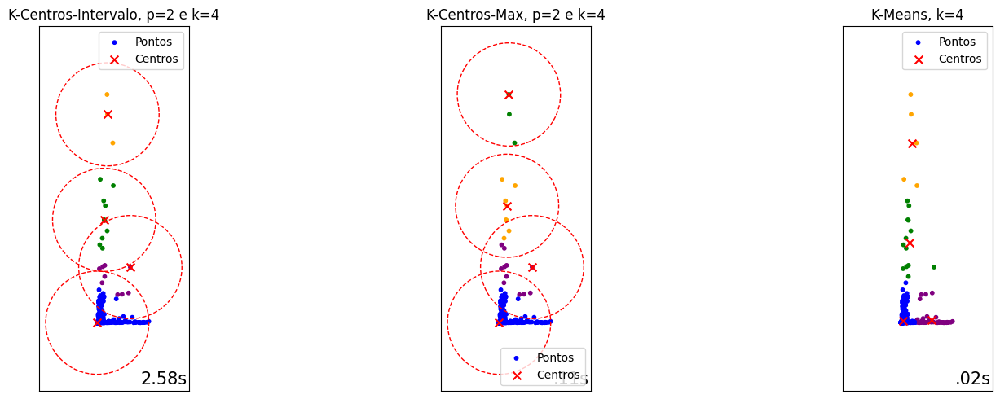

In [ ]:
facebook_live_sellers_in_thailand = fetch_ucirepo(id=488)
X_df = facebook_live_sellers_in_thailand.data.features

sampled_df = X_df[['num_likes', 'num_comments','status_type']].sample(n=700, random_state=42)
Likes = sampled_df['num_likes']
Comments = sampled_df['num_comments']
X = list(zip(Likes, Comments))

num_k = len(sampled_df['status_type'].unique())

a_tabela = processar_e_plotar(X, var_x_name='Likes', var_y_name='Comments', title='Relação entre Likes e Comments', k=num_k, p=1, sol=sampled_df['num_comments'], a_tabela=a_tabela, n= 2)
a_tabela = processar_e_plotar(X, var_x_name='Likes', var_y_name='Comments', title='Relação entre Likes e Comments', k=num_k, p=2, sol=sampled_df['num_comments'], a_tabela=a_tabela, n= 2)

K-Means
Média do Raio Ótimo: 3.023
Desvio Padrão do Raio Ótimo: 0.0
Tempo: 0.051
Média Rand Index: 0.043
Média Silhueta: 0.54

K-Centros-Intervalo
Raio Ótimo: 1.663
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.034
Rand Index: 0.068
Silhueta: 0.484

K-Centros-Max
Raio Ótimo: 1.423
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.181
Rand Index: 0.068
Silhueta: 0.484




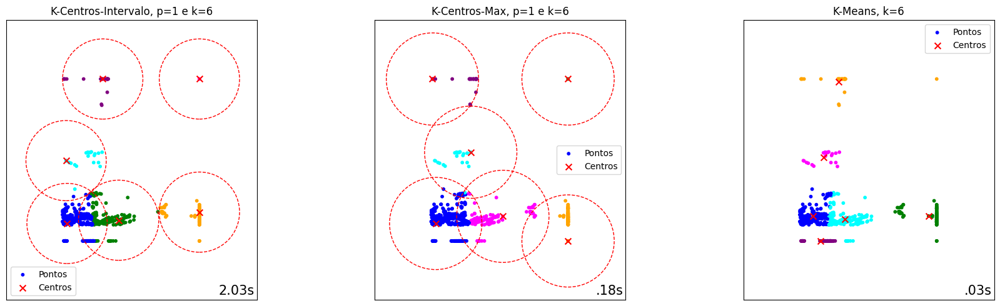

K-Means
Média do Raio Ótimo: 3.023
Desvio Padrão do Raio Ótimo: 0.0
Tempo: 0.032
Média Rand Index: 0.042
Média Silhueta: 0.54

K-Centros-Intervalo
Raio Ótimo: 1.241
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.13
Rand Index: 0.065
Silhueta: 0.485

K-Centros-Max
Raio Ótimo: 1.423
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.163
Rand Index: 0.065
Silhueta: 0.485




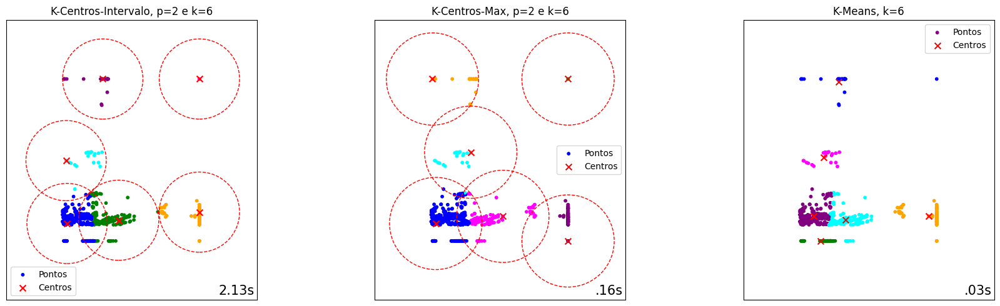

In [ ]:
travel_review_ratings = fetch_ucirepo(id=485)
X = travel_review_ratings.data.features

sampled_df = X[['burger/pizza shops', 'gyms','art galleries']].sample(n=700, random_state=42)

sampled_df['art galleries'] = sampled_df['art galleries'] - sampled_df['art galleries'] % 1

burger_pizza_shops = sampled_df['burger/pizza shops']
gyms = sampled_df['gyms']
X_points = list(zip(burger_pizza_shops, gyms))

num_k = len(sampled_df['art galleries'].unique())

a_tabela = processar_e_plotar(X_points, var_x_name='Burger/Pizza Shops', var_y_name='Gyms', title='Relação entre Burger/Pizza Shops e Gyms', k=num_k, p=1,sol=sampled_df['art galleries'], a_tabela=a_tabela, n= 3)
a_tabela = processar_e_plotar(X_points, var_x_name='Burger/Pizza Shops', var_y_name='Gyms', title='Relação entre Burger/Pizza Shops e Gyms', k=num_k, p=2,sol=sampled_df['art galleries'], a_tabela=a_tabela, n= 3)

<ipython-input-24-1eebbe9b13bb>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Category 3'] = np.floor(X['Category 3'])


K-Means
Média do Raio Ótimo: 1.953
Desvio Padrão do Raio Ótimo: 0.009
Tempo: 0.052
Média Rand Index: -0.003
Média Silhueta: 0.375

K-Centros-Intervalo
Raio Ótimo: 1.492
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.067
Rand Index: 0.032
Silhueta: 0.455

K-Centros-Max
Raio Ótimo: 1.321
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.091
Rand Index: 0.032
Silhueta: 0.455




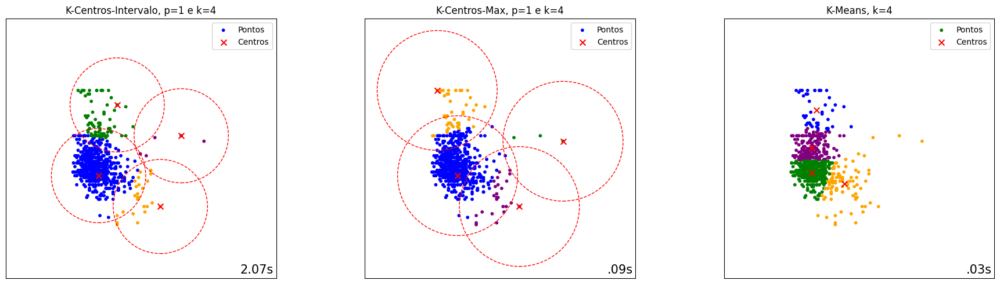

K-Means
Média do Raio Ótimo: 1.954
Desvio Padrão do Raio Ótimo: 0.009
Tempo: 0.03
Média Rand Index: -0.003
Média Silhueta: 0.375

K-Centros-Intervalo
Raio Ótimo: 1.141
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.121
Rand Index: 0.036
Silhueta: 0.455

K-Centros-Max
Raio Ótimo: 1.321
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.093
Rand Index: 0.036
Silhueta: 0.455




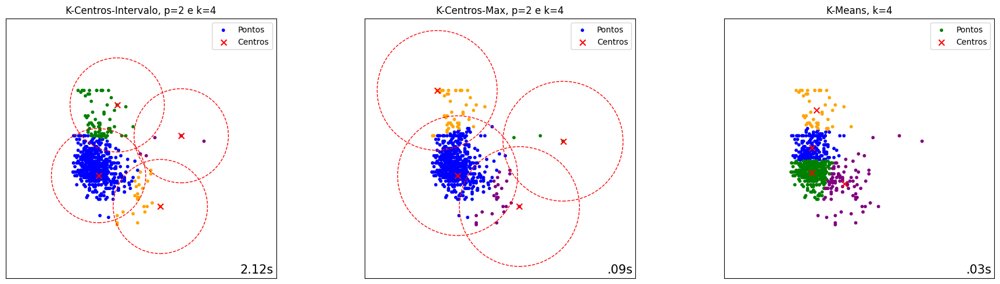

In [ ]:
travel_reviews = fetch_ucirepo(id=484)
X = travel_reviews.data.features

X['Category 3'] = np.floor(X['Category 3'])

sampled_df = X[['Category 1', 'Category 2','Category 3']].sample(n=700, random_state=42)

burger_pizza_shops = sampled_df['Category 1']
gyms = sampled_df['Category 2']
X_points = list(zip(burger_pizza_shops, gyms))

num_k = len(sampled_df['Category 3'].unique())

a_tabela = processar_e_plotar(X_points, var_x_name='Art Galleries', var_y_name='Dance Clubs', title='Relação entre Art Galleries e Dance Clubs', k=num_k, p=1,sol=sampled_df['Category 3'], a_tabela=a_tabela, n= 4)
a_tabela = processar_e_plotar(X_points, var_x_name='Art Galleries', var_y_name='Dance Clubs', title='Relação entre Art Galleries e Dance Clubs', k=num_k, p=2,sol=sampled_df['Category 3'], a_tabela=a_tabela, n= 4)

K-Means
Média do Raio Ótimo: 5.062
Desvio Padrão do Raio Ótimo: 0.0
Tempo: 0.035
Média Rand Index: 0.084
Média Silhueta: 0.505

K-Centros-Intervalo
Raio Ótimo: 5.199
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.161
Rand Index: 0.055
Silhueta: 0.424

K-Centros-Max
Raio Ótimo: 5.318
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.193
Rand Index: 0.055
Silhueta: 0.424




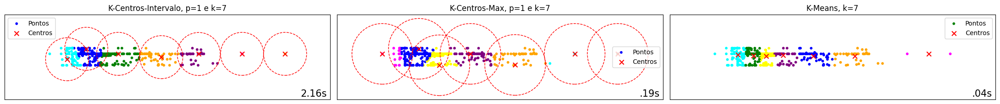

K-Means
Média do Raio Ótimo: 5.009
Desvio Padrão do Raio Ótimo: 0.16
Tempo: 0.047
Média Rand Index: 0.084
Média Silhueta: 0.507

K-Centros-Intervalo
Raio Ótimo: 4.245
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.498
Rand Index: 0.06
Silhueta: 0.431

K-Centros-Max
Raio Ótimo: 4.612
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.199
Rand Index: 0.06
Silhueta: 0.431




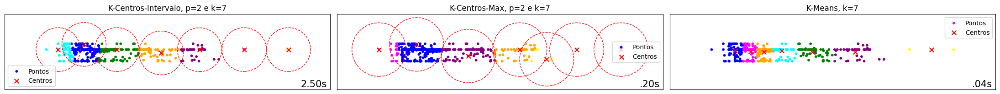

In [ ]:
estimation_of_obesity_levels_based_on_eating_habits_and_physical_condition = fetch_ucirepo(id=544)
X_df = estimation_of_obesity_levels_based_on_eating_habits_and_physical_condition.data.features
y_df = estimation_of_obesity_levels_based_on_eating_habits_and_physical_condition.data.targets

X_df['NObeyesdad'] = y_df['NObeyesdad']

sampled_df = X_df[['Age', 'NCP', 'NObeyesdad']].sample(n=700, random_state=42)

Age = sampled_df['Age']
NCP = sampled_df['NCP']
X = list(zip(Age, NCP))

num_k = len(X_df['NObeyesdad'].unique())

a_tabela = processar_e_plotar(X, var_x_name='Age', var_y_name='Number of main meals (NCP)', title='Relação entre Age e NCP', k=num_k, p=1, sol=sampled_df['NObeyesdad'], a_tabela=a_tabela, n= 5)
a_tabela = processar_e_plotar(X, var_x_name='Age', var_y_name='Number of main meals (NCP)', title='Relação entre Age e NCP', k=num_k, p=2, sol=sampled_df['NObeyesdad'], a_tabela=a_tabela, n= 5)

K-Means
Média do Raio Ótimo: 41.59
Desvio Padrão do Raio Ótimo: 0.0
Tempo: 0.034
Média Rand Index: 0.29
Média Silhueta: 0.577

K-Centros-Intervalo
Raio Ótimo: 23.892
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.616
Rand Index: 0.216
Silhueta: 0.544

K-Centros-Max
Raio Ótimo: 21.194
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.295
Rand Index: 0.216
Silhueta: 0.544




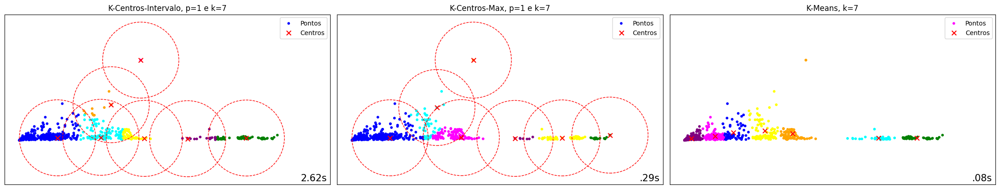

K-Means
Média do Raio Ótimo: 40.815
Desvio Padrão do Raio Ótimo: 4.174
Tempo: 0.044
Média Rand Index: 0.29
Média Silhueta: 0.578

K-Centros-Intervalo
Raio Ótimo: 19.822
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.127
Rand Index: 0.285
Silhueta: 0.522

K-Centros-Max
Raio Ótimo: 21.194
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.212
Rand Index: 0.285
Silhueta: 0.522




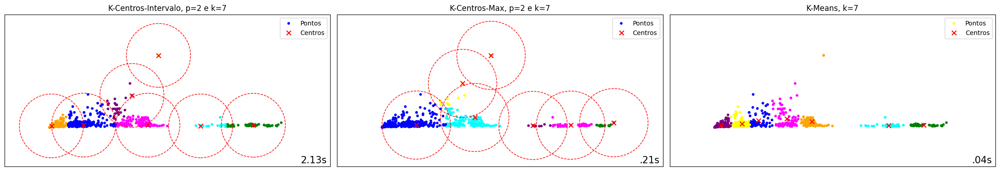

In [ ]:
statlog_image_segmentation = fetch_ucirepo(id=147)

X_df = statlog_image_segmentation.data.features
y_df = statlog_image_segmentation.data.targets

X_df['class'] = y_df['class']

sampled_df = X_df[['intensity-mean', 'hedge-mean','class']].sample(n=700, random_state=42)

intensity_mean = sampled_df['intensity-mean'].values
hedge_mean = sampled_df['hedge-mean'].values
X = np.column_stack((intensity_mean, hedge_mean))

num_k = len(X_df['class'].unique())

a_tabela = processar_e_plotar(X, var_x_name='intensity-mean', var_y_name='hedge-mean', title='Relação entre Intensity Mean e Hedge Mean', k=num_k, p=1, sol=sampled_df['class'], a_tabela=a_tabela, n= 6)
a_tabela = processar_e_plotar(X, var_x_name='intensity-mean', var_y_name='hedge-mean', title='Relação entre Intensity Mean e Hedge Mean', k=num_k, p=2, sol=sampled_df['class'], a_tabela=a_tabela, n= 6)

K-Means
Média do Raio Ótimo: 29.783
Desvio Padrão do Raio Ótimo: 0.0
Tempo: 0.013
Média Rand Index: -0.018
Média Silhueta: 0.561

K-Centros-Intervalo
Raio Ótimo: 42.004
Desvio Padrão do Raio Ótimo: 0
Tempo: 4.709
Rand Index: -0.078
Silhueta: 0.521

K-Centros-Max
Raio Ótimo: 32.696
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.042
Rand Index: -0.078
Silhueta: 0.521




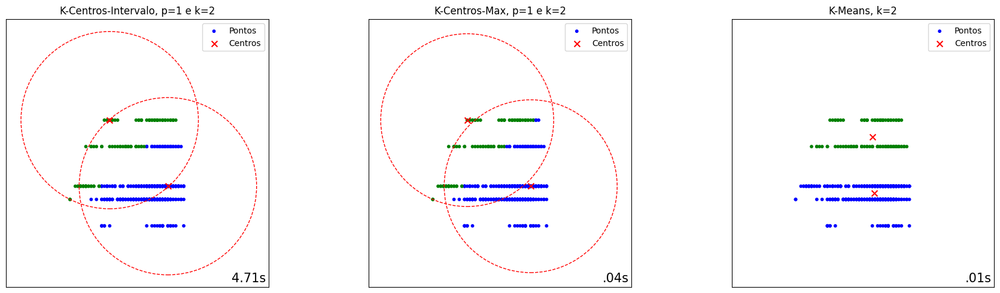

K-Means
Média do Raio Ótimo: 29.783
Desvio Padrão do Raio Ótimo: 0.0
Tempo: 0.013
Média Rand Index: -0.018
Média Silhueta: 0.561

K-Centros-Intervalo
Raio Ótimo: 33.305
Desvio Padrão do Raio Ótimo: 0
Tempo: 4.194
Rand Index: -0.035
Silhueta: 0.501

K-Centros-Max
Raio Ótimo: 33.302
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.034
Rand Index: -0.035
Silhueta: 0.501




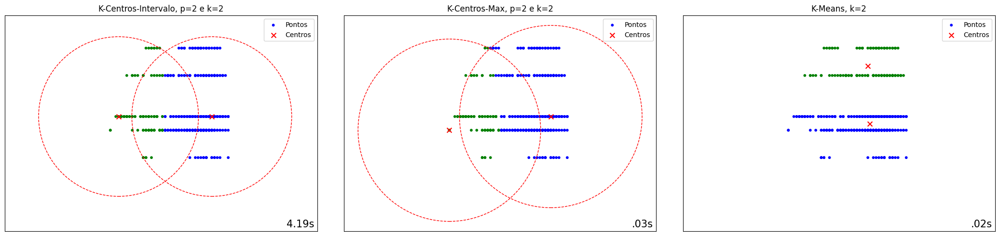

In [ ]:
iranian_churn = fetch_ucirepo(id=563)

X_df = iranian_churn.data.features
y_df = iranian_churn.data.targets

X_df['Churn'] = y_df['Churn']

sampled_df = X_df[['Subscription  Length', 'Age','Churn']].sample(n=700, random_state=42)

customer_value = sampled_df['Subscription  Length'].values
age = sampled_df['Age'].values
X = np.column_stack((customer_value, age))

num_k = len(sampled_df['Churn'].unique())

a_tabela = processar_e_plotar(X, var_x_name='Customer Value', var_y_name='Age', title='Relação entre Customer Value e Age', k=num_k, p=1, sol=sampled_df['Churn'], a_tabela=a_tabela, n= 7)
a_tabela = processar_e_plotar(X, var_x_name='Customer Value', var_y_name='Age', title='Relação entre Customer Value e Age', k=num_k, p=2, sol=sampled_df['Churn'], a_tabela=a_tabela, n= 7)

K-Means
Média do Raio Ótimo: 63.724
Desvio Padrão do Raio Ótimo: 0.0
Tempo: 0.021
Média Rand Index: 0.705
Média Silhueta: 0.632

K-Centros-Intervalo
Raio Ótimo: 120.531
Desvio Padrão do Raio Ótimo: 0
Tempo: 3.05
Rand Index: 0.109
Silhueta: 0.397

K-Centros-Max
Raio Ótimo: 94.473
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.028
Rand Index: 0.109
Silhueta: 0.397




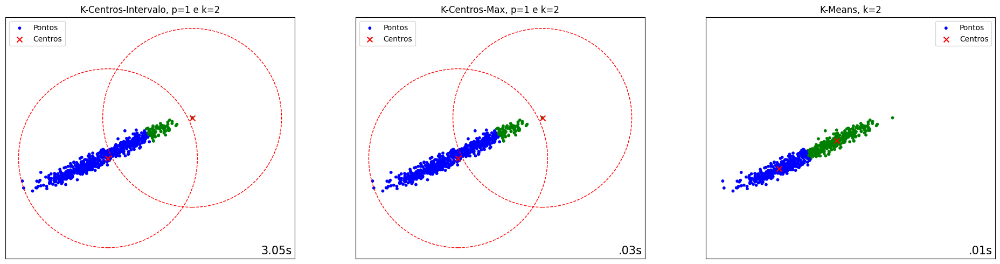

K-Means
Média do Raio Ótimo: 63.724
Desvio Padrão do Raio Ótimo: 0.0
Tempo: 0.013
Média Rand Index: 0.705
Média Silhueta: 0.632

K-Centros-Intervalo
Raio Ótimo: 94.475
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.266
Rand Index: 0.099
Silhueta: 0.39

K-Centros-Max
Raio Ótimo: 94.473
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.028
Rand Index: 0.099
Silhueta: 0.39




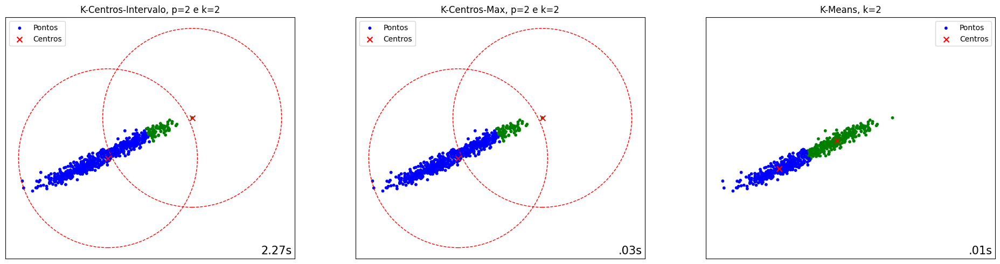

In [ ]:
rice_cammeo_and_osmancik = fetch_ucirepo(id=545)

X_df = rice_cammeo_and_osmancik.data.features
y_df = rice_cammeo_and_osmancik.data.targets

X_df['Class'] = y_df['Class']

sampled_df = X_df[['Perimeter', 'Major_Axis_Length','Class']].sample(n=700, random_state=42)

Perimeter = sampled_df['Perimeter'].values
Eccentricity = sampled_df['Major_Axis_Length'].values
X = np.column_stack((Perimeter, Eccentricity))

[(0, 2), (2, 5)]

num_k = len(sampled_df['Class'].unique())

a_tabela = processar_e_plotar(X, var_x_name='Perimeter', var_y_name='Major_Axis_Length', title='Relação entre Perimeter e Eccentricity', k=num_k, p=1, sol=sampled_df['Class'], a_tabela=a_tabela, n= 8)
a_tabela = processar_e_plotar(X, var_x_name='Perimeter', var_y_name='Major_Axis_Length', title='Relação entre Perimeter e Eccentricity', k=num_k, p=2, sol=sampled_df['Class'], a_tabela=a_tabela, n= 8)

<ipython-input-29-59b98637bc39>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_df['quality'] = y_df['quality']


K-Means
Média do Raio Ótimo: 4.544
Desvio Padrão do Raio Ótimo: 0.002
Tempo: 0.06
Média Rand Index: -0.009
Média Silhueta: 0.471

K-Centros-Intervalo
Raio Ótimo: 5.404
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.272
Rand Index: -0.021
Silhueta: 0.464

K-Centros-Max
Raio Ótimo: 4.397
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.153
Rand Index: -0.021
Silhueta: 0.464




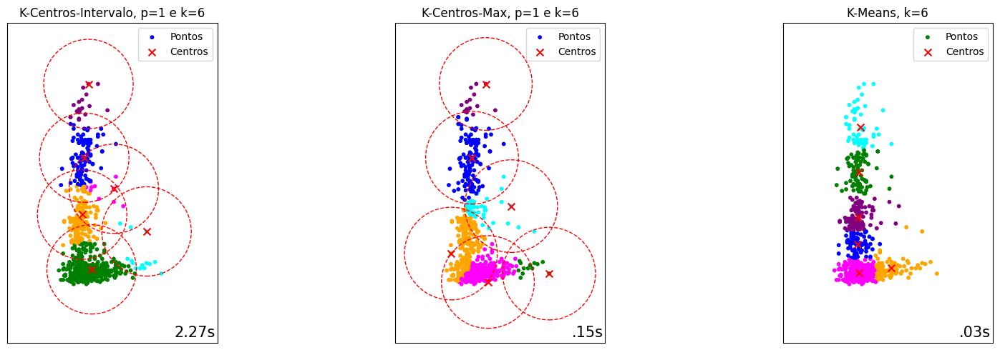

K-Means
Média do Raio Ótimo: 4.545
Desvio Padrão do Raio Ótimo: 0.003
Tempo: 0.034
Média Rand Index: -0.009
Média Silhueta: 0.471

K-Centros-Intervalo
Raio Ótimo: 3.876
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.33
Rand Index: -0.025
Silhueta: 0.504

K-Centros-Max
Raio Ótimo: 4.064
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.152
Rand Index: -0.025
Silhueta: 0.504




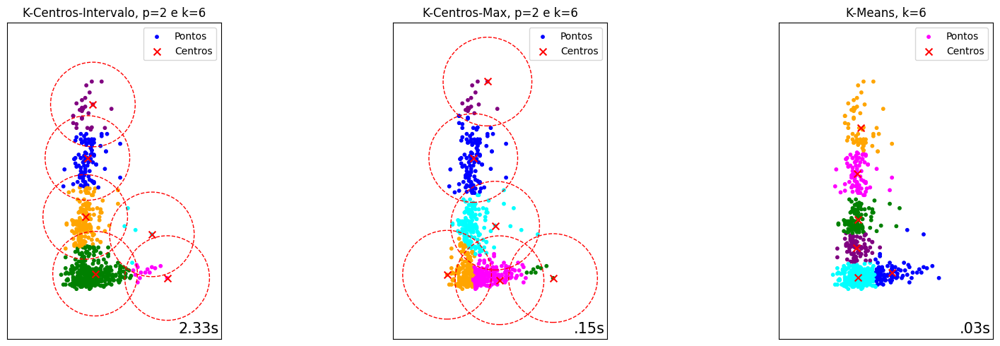

In [ ]:
wine_quality = fetch_ucirepo(id=186)

X_df = wine_quality.data.features
y_df = wine_quality.data.targets

X_df['quality'] = y_df['quality']

sampled_df = X_df[['fixed_acidity', 'residual_sugar','quality']].sample(n=700, random_state=42)

fixed_acidity = sampled_df['fixed_acidity'].values
residual_sugar = sampled_df['residual_sugar'].values
X = np.column_stack((fixed_acidity, residual_sugar))

num_k = len(sampled_df['quality'].unique())

a_tabela = processar_e_plotar(X, var_x_name='fixed_acidity', var_y_name='residual_sugar', title='Relação entre Fixed Acidity e Residual Sugar', k=num_k, p=1, sol=sampled_df['quality'], a_tabela=a_tabela, n= 9)
a_tabela = processar_e_plotar(X, var_x_name='fixed_acidity', var_y_name='residual_sugar', title='Relação entre Fixed Acidity e Residual Sugar', k=num_k, p=2, sol=sampled_df['quality'], a_tabela=a_tabela, n= 9)

<ipython-input-30-49f7b9740a02>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_df['alcohol'] = y_df['alcohol']


K-Means
Média do Raio Ótimo: 2.313
Desvio Padrão do Raio Ótimo: 0.115
Tempo: 0.043
Média Rand Index: -0.002
Média Silhueta: 0.332

K-Centros-Intervalo
Raio Ótimo: 2.196
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.153
Rand Index: -0.004
Silhueta: 0.243

K-Centros-Max
Raio Ótimo: 2.002
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.219
Rand Index: -0.004
Silhueta: 0.243




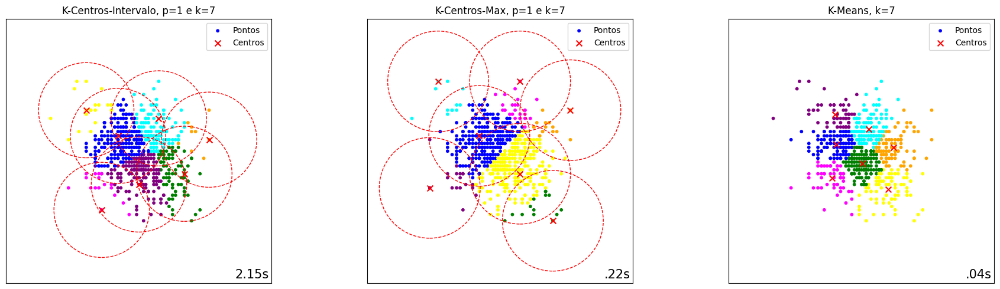

K-Means
Média do Raio Ótimo: 2.312
Desvio Padrão do Raio Ótimo: 0.131
Tempo: 0.058
Média Rand Index: -0.003
Média Silhueta: 0.332

K-Centros-Intervalo
Raio Ótimo: 1.899
Desvio Padrão do Raio Ótimo: 0
Tempo: 2.939
Rand Index: -0.009
Silhueta: 0.236

K-Centros-Max
Raio Ótimo: 2.04
Desvio Padrão do Raio Ótimo: 0
Tempo: 0.196
Rand Index: -0.009
Silhueta: 0.236




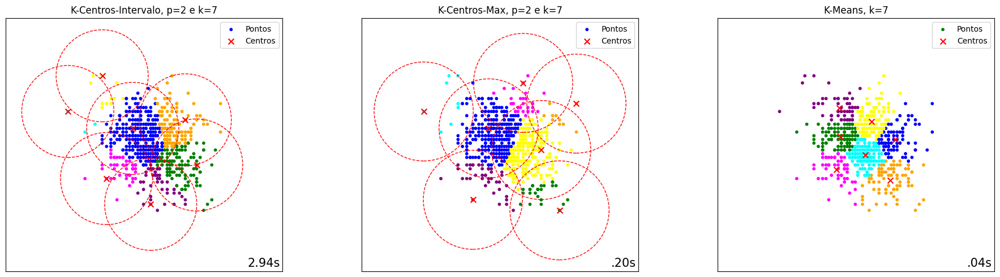

In [ ]:
drug_consumption_quantified = fetch_ucirepo(id=373)

X_df = drug_consumption_quantified.data.features
y_df = drug_consumption_quantified.data.targets

X_df['alcohol'] = y_df['alcohol']

sampled_df = X_df[['nscore', 'ascore','alcohol']].sample(n=700, random_state=42)

nscore = sampled_df['nscore'].values
ascore = sampled_df['ascore'].values
X = np.column_stack((nscore, ascore))

num_k = len(sampled_df['alcohol'].unique())

a_tabela = processar_e_plotar(X, var_x_name='nscore', var_y_name='ascore', title='Relação entre NScore e AScore', k=num_k, p=1, sol=sampled_df['alcohol'], a_tabela=a_tabela, n= 10)
a_tabela = processar_e_plotar(X, var_x_name='nscore', var_y_name='ascore', title='Relação entre NScore e AScore', k=num_k, p=2, sol=sampled_df['alcohol'], a_tabela=a_tabela, n= 10)

# Análise

In [ ]:
#print(a_tabela[a_tabela['Método']=='K-Means'])
a_tabela

,Descrição,Método,Raio,Rand,Silhueta,Tempo,K,Largura,Desvio
0,Dado Scikit 1,K-Centros-Intervalo P = 1,2.442131,-2.000000,-2.00000,2.514783,3.0,0.0,0.000000
1,Dado Scikit 1,K-Centros-Max P = 1,2.442131,-2.000000,-2.00000,0.026134,3.0,0.0,0.000000
2,Dado Scikit 1,K-Means,2.442131,-2.000000,-2.00000,0.062945,3.0,0.0,0.000000
3,Dado Scikit 2,K-Centros-Intervalo P = 1,2.442131,-2.000000,-2.00000,3.982729,3.0,0.0,0.000000
4,Dado Scikit 2,K-Centros-Max P = 1,2.442131,-2.000000,-2.00000,0.074065,3.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...
261,Dados Empíricos 10,K-Means,2.312607,-0.002411,0.33152,0.038957,7.0,0.0,0.114674
262,Dados Empíricos 10,K-Centros-Intervalo P = 1,2.196406,-2.000000,-2.00000,2.152945,7.0,0.0,0.000000
263,Dados Empíricos 10,K-Centros-Max P = 1,2.001501,-2.000000,-2.00000,0.218817,7.0,0.0,0.000000
264,Dados Empíricos 10,K-Centros-Intervalo P = 2,1.898814,-2.000000,-2.00000,2.938753,7.0,0.0,0.000000


<ipython-input-32-8237cfcf1276>:63: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_coef, _ = pearsonr(x_valz, y_valz)


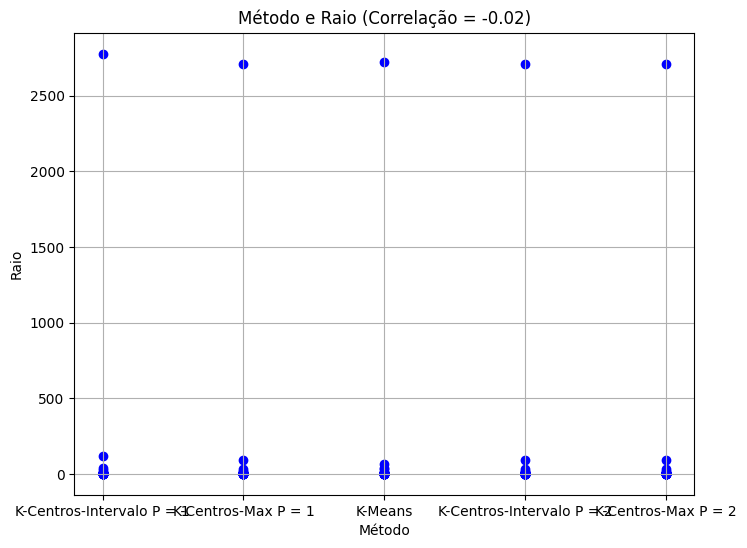

1


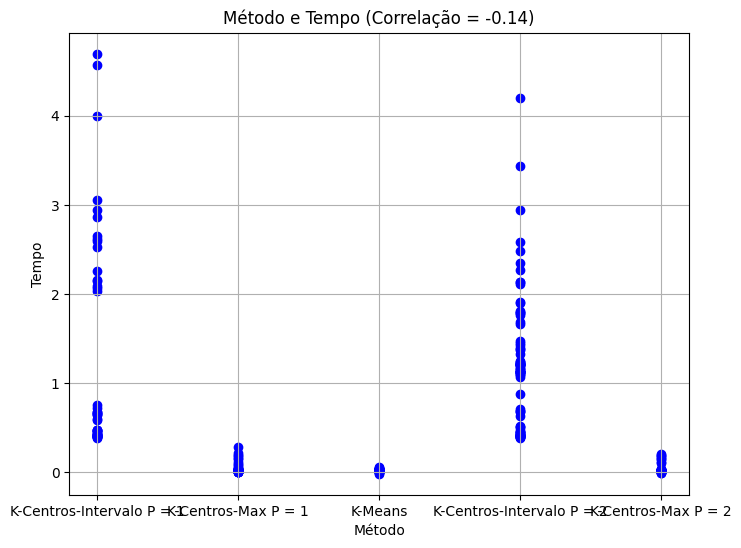

2


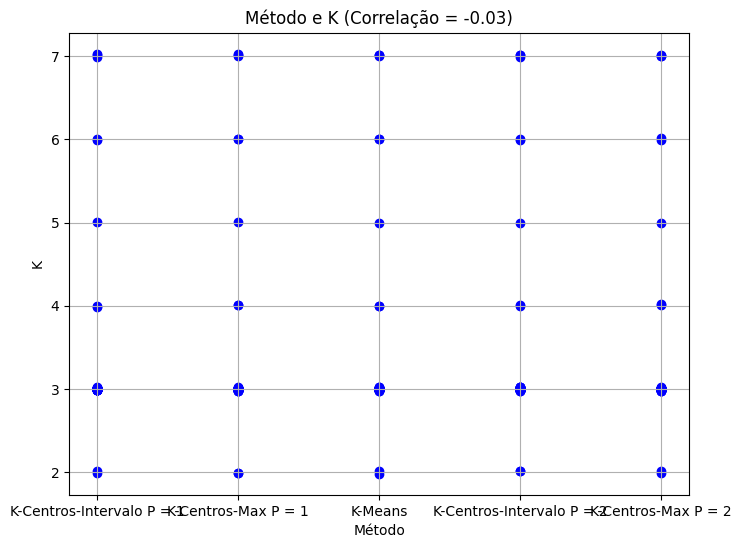

3


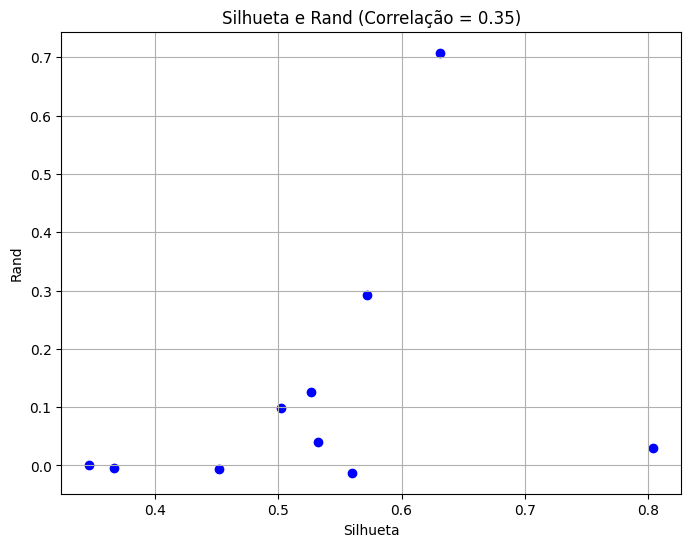

4


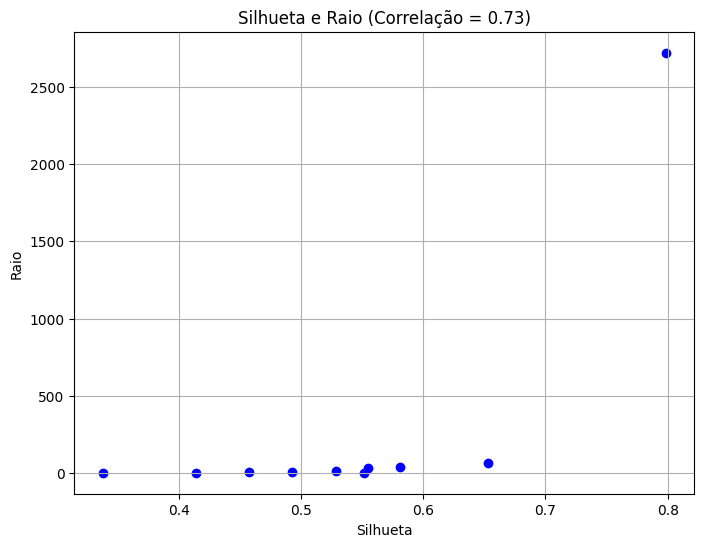

5


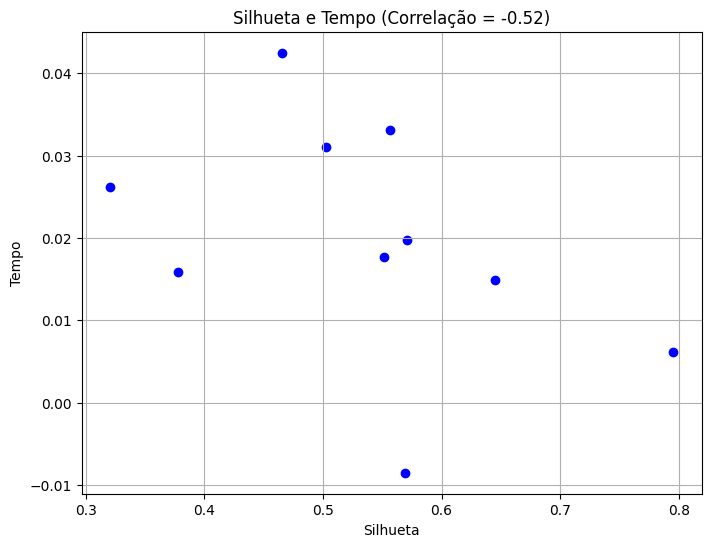

6


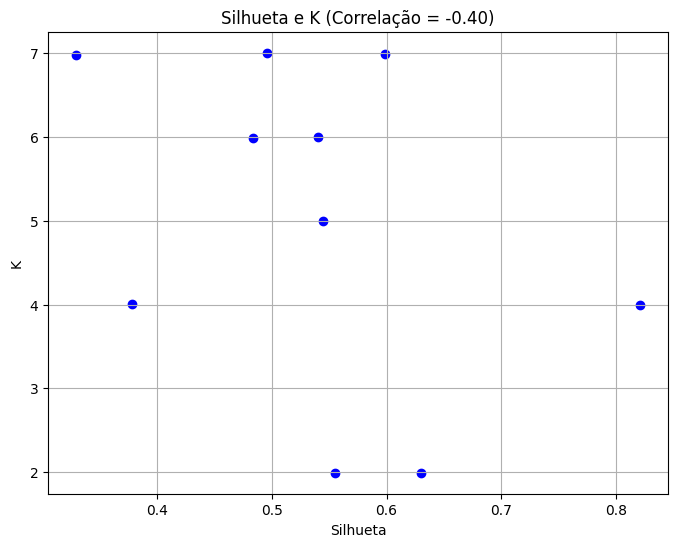

7


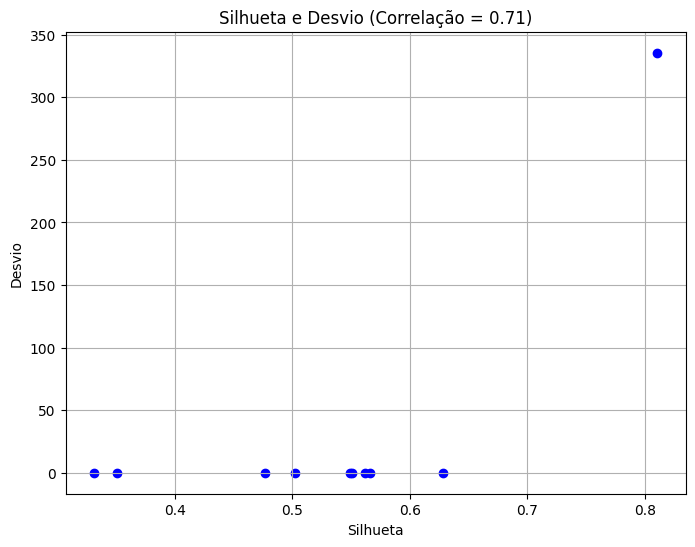

8


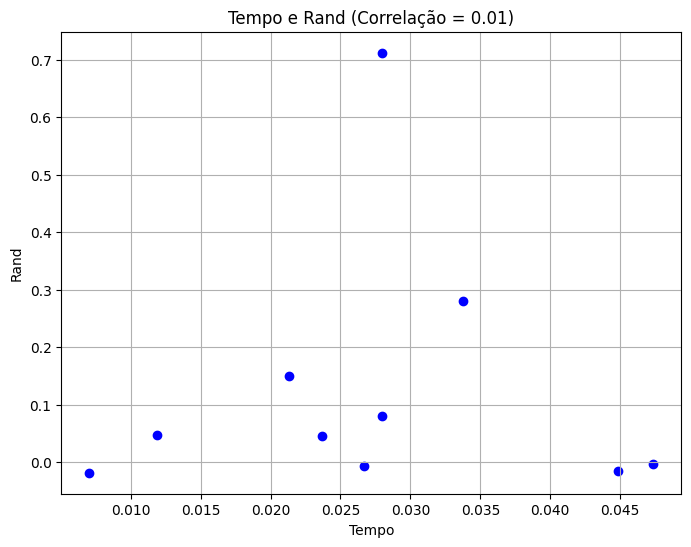

9


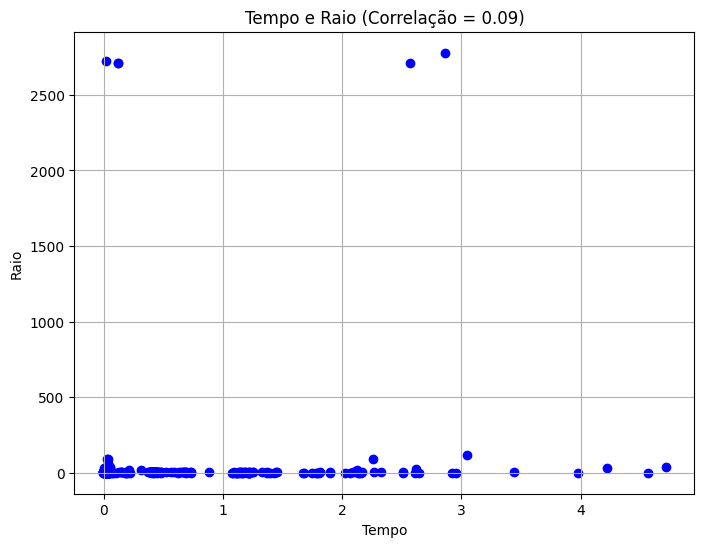

10


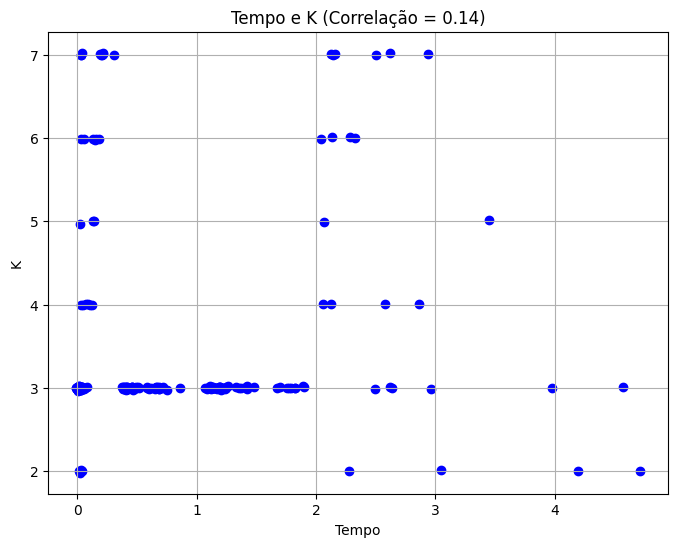

11


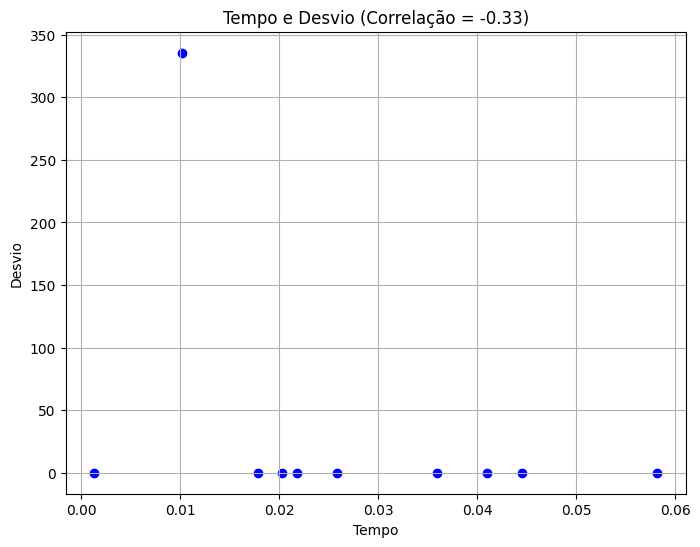

12


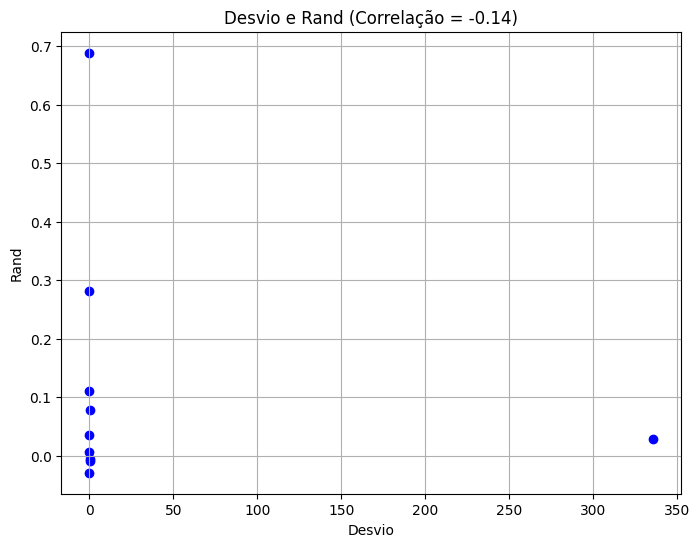

13


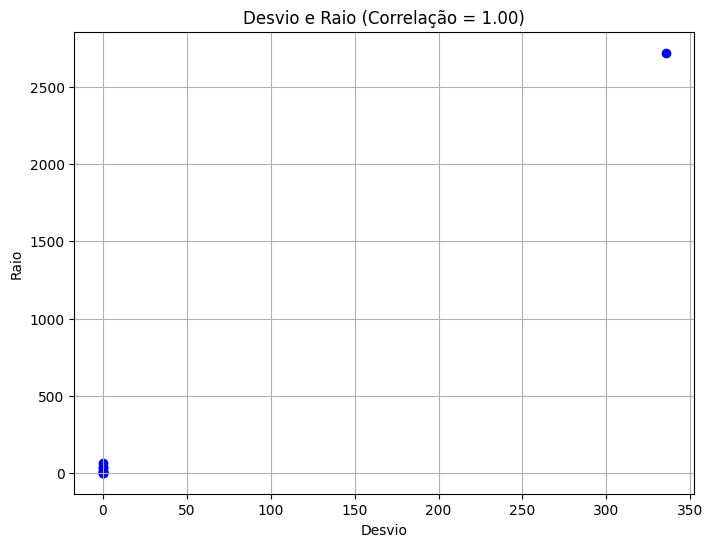

14


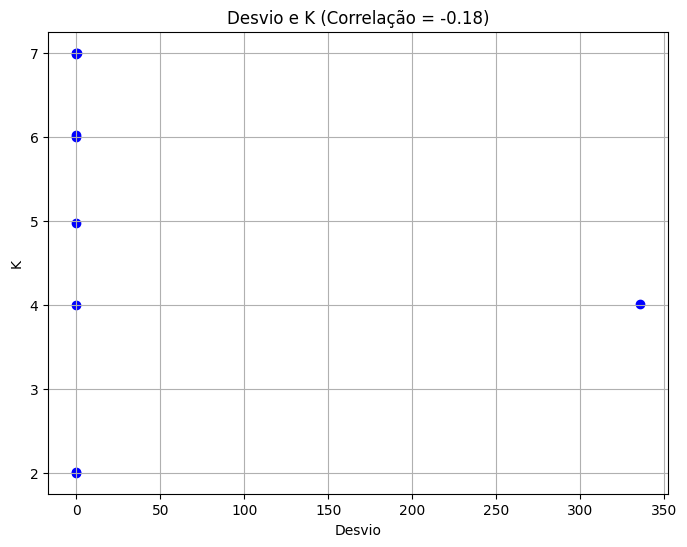

15


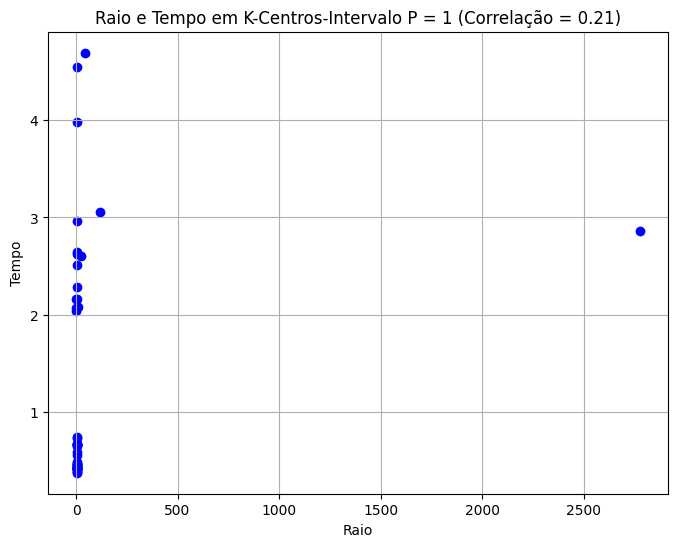

16


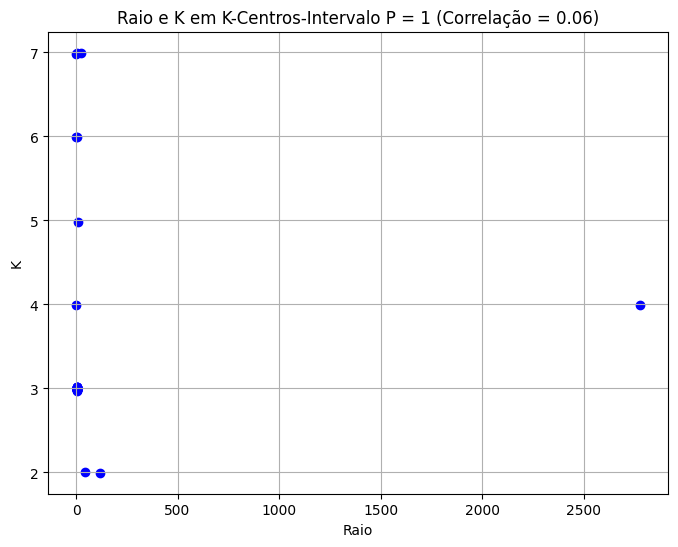

17


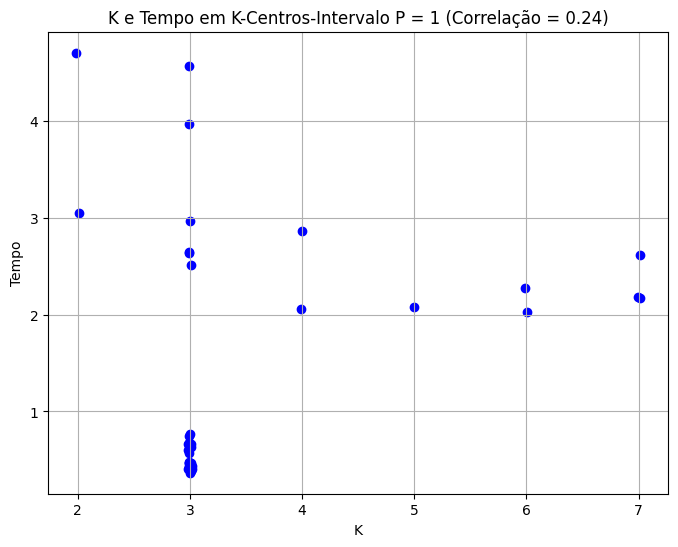

18


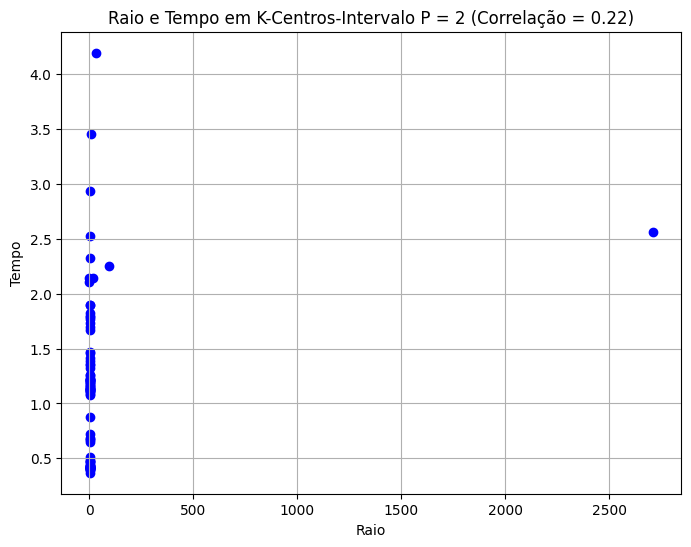

19


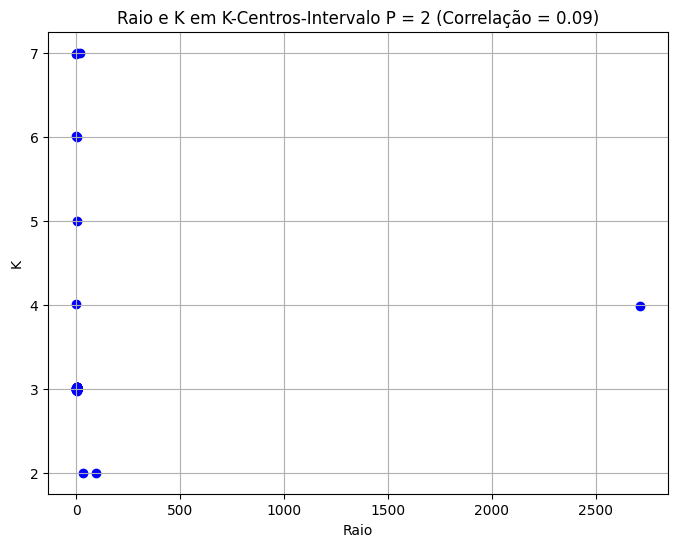

20


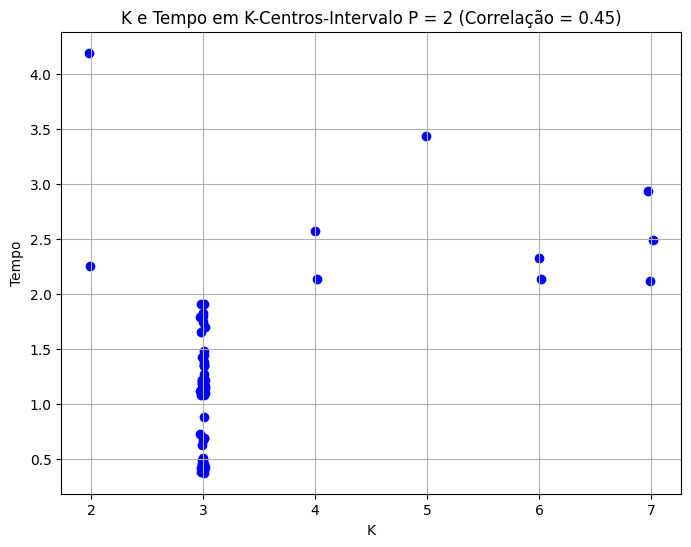

21


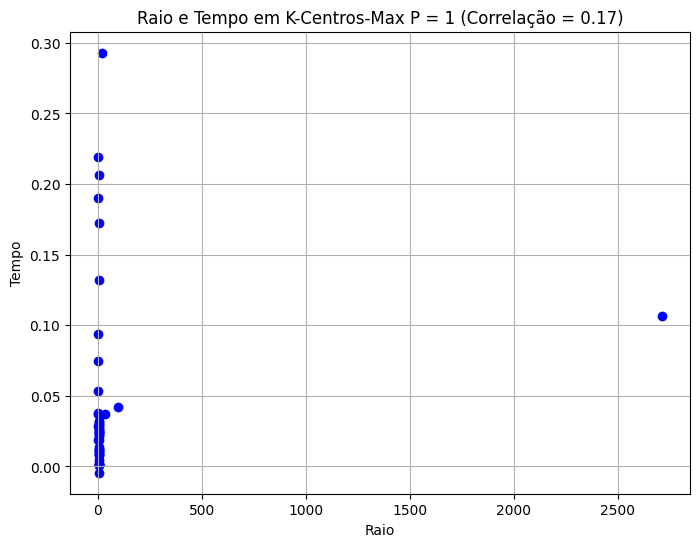

22


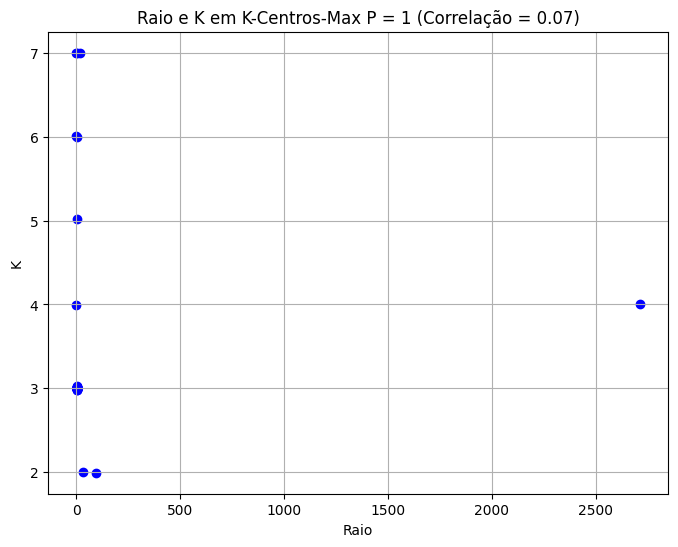

23


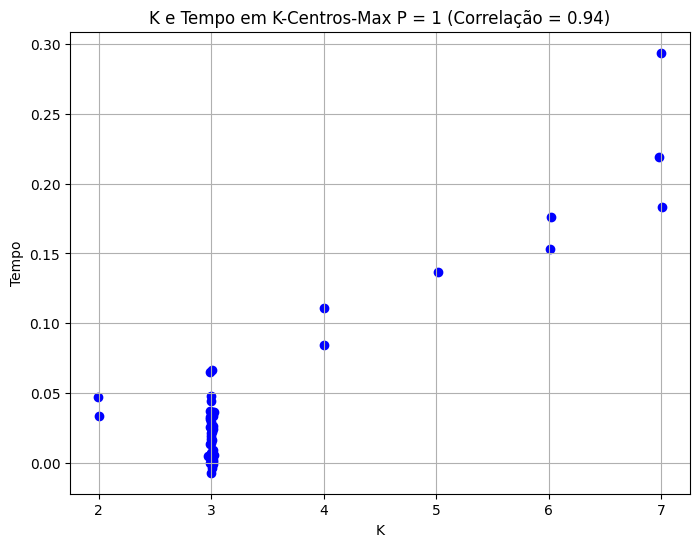

24


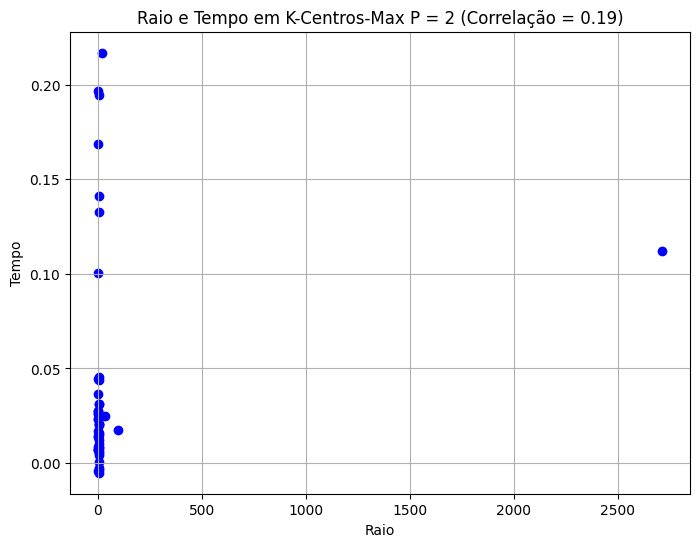

25


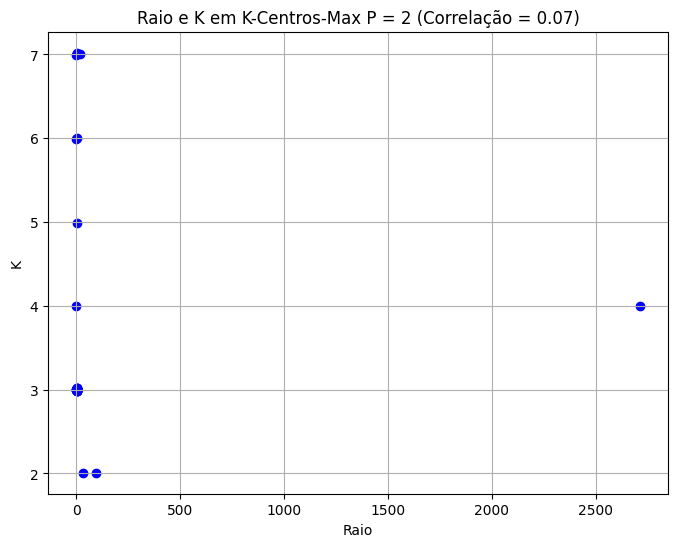

26


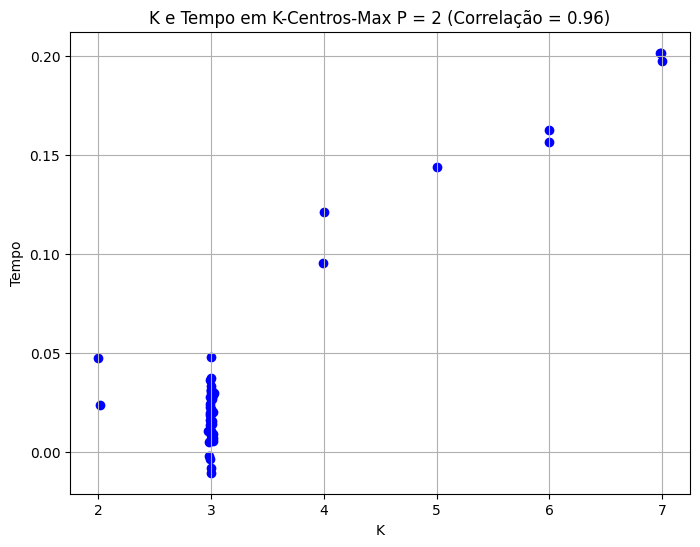

27


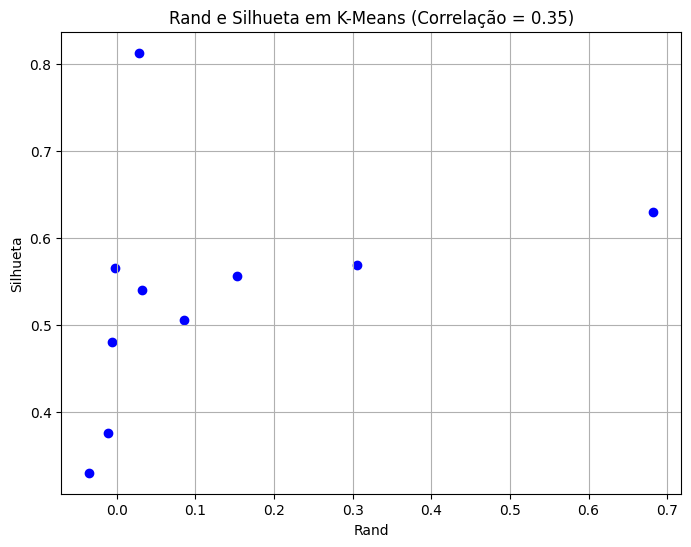

28


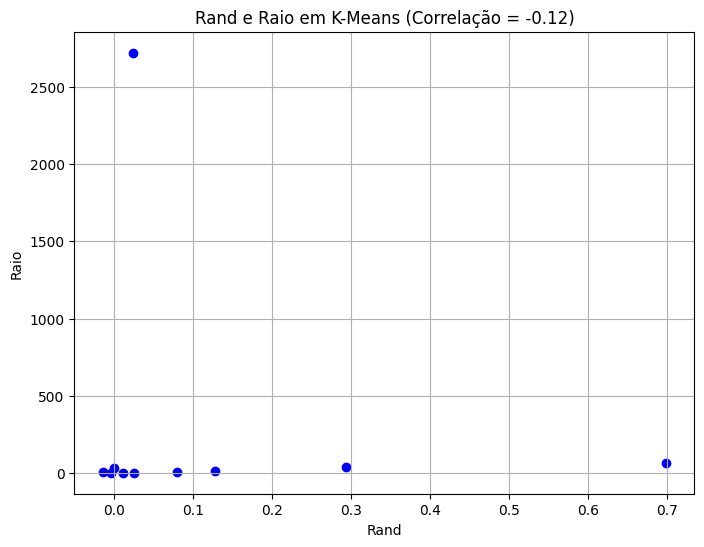

29


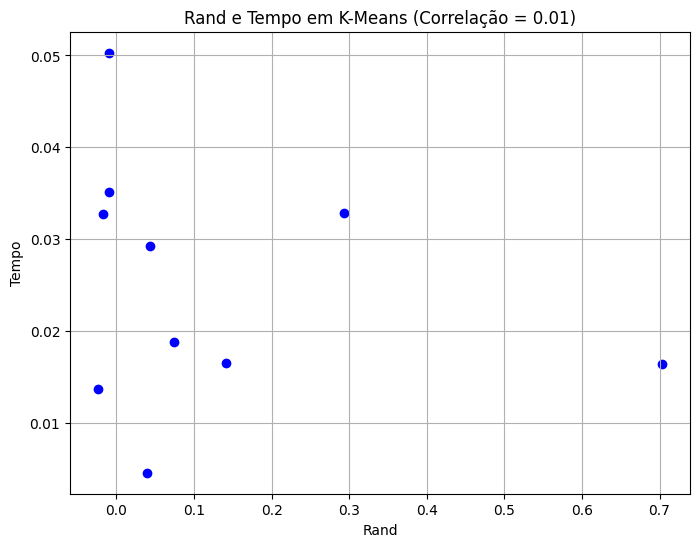

30


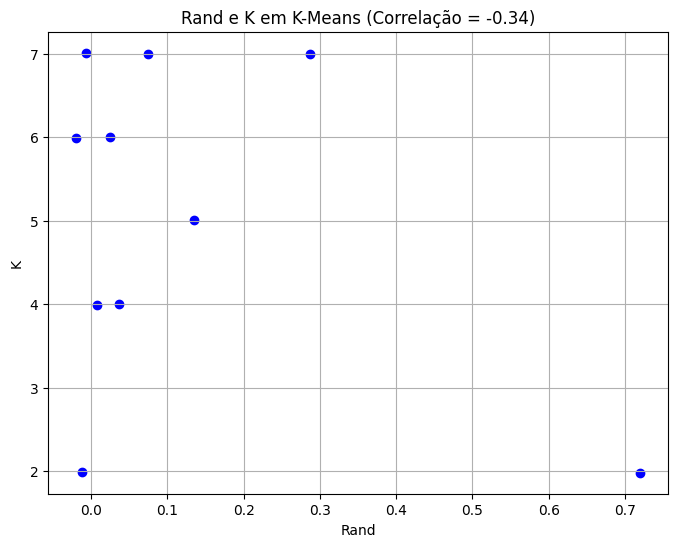

31


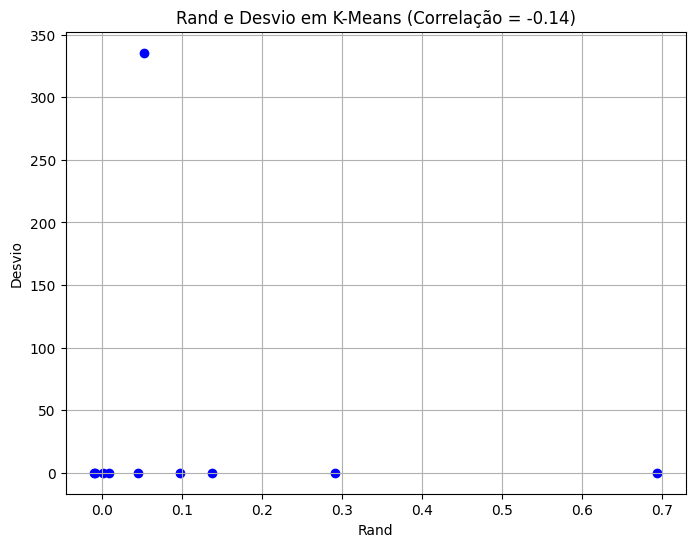

32


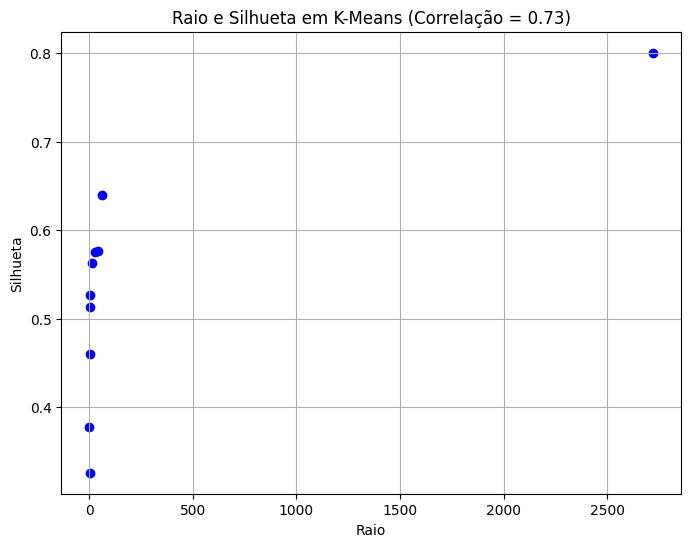

33


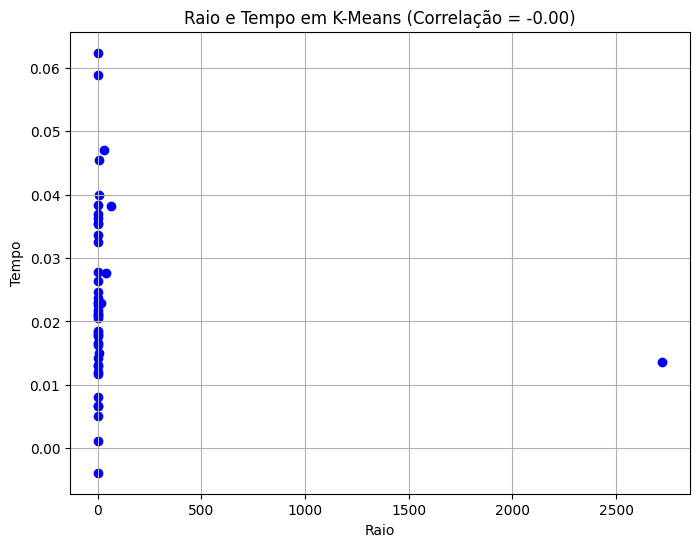

34


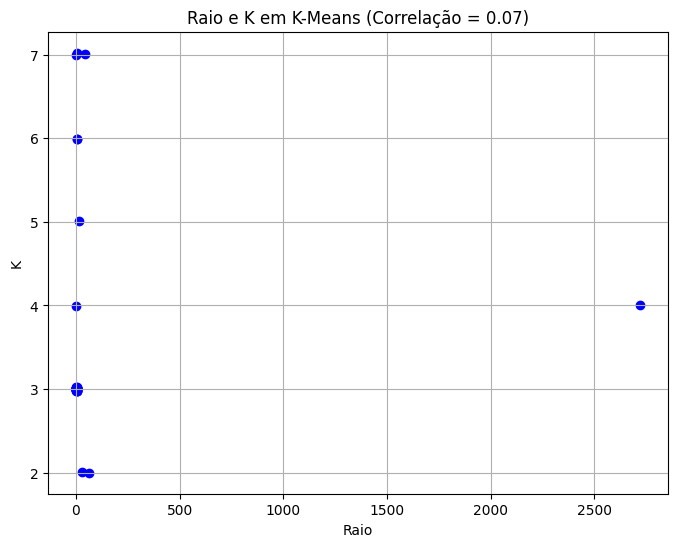

35


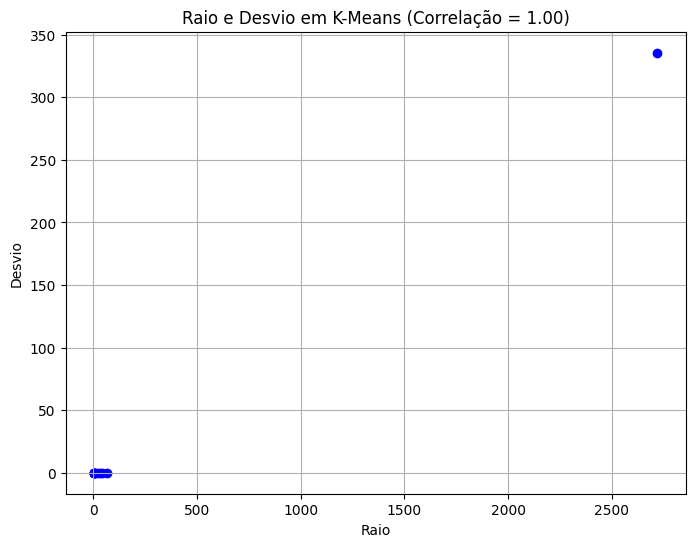

36


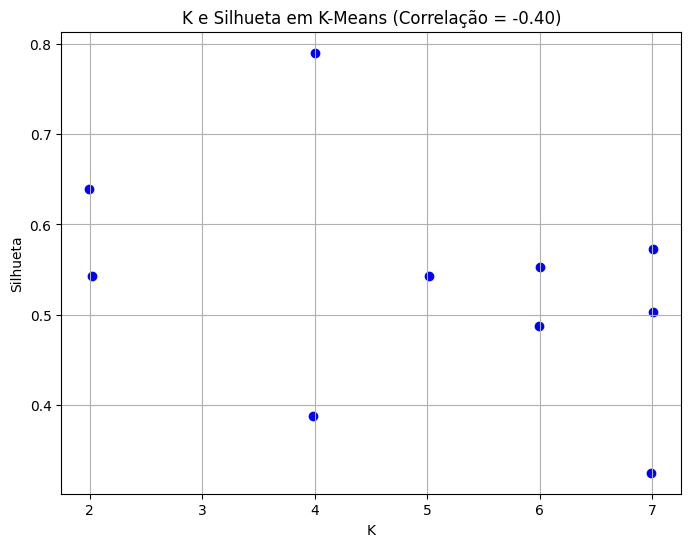

37


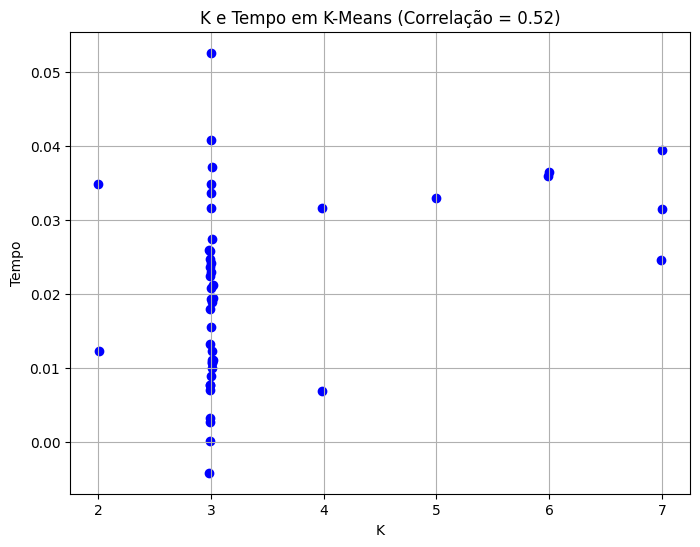

38


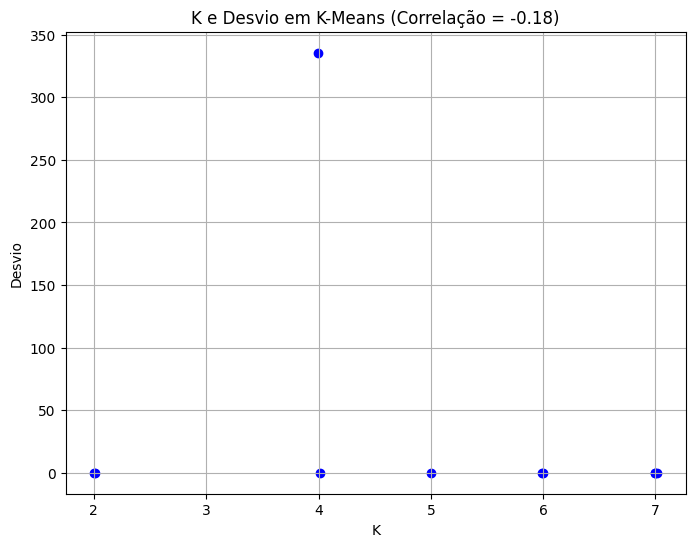

39


In [ ]:
from scipy.stats import pearsonr
metodos = ['K-Centros-Intervalo P = 1', 'K-Centros-Intervalo P = 2', 'K-Centros-Max P = 1', 'K-Centros-Max P = 2', 'K-Means']

count = 0

def turno2(metodo):
  if metodo == 'K-Centros-Intervalo P = 1':
    return -1
  elif metodo == 'K-Centros-Intervalo P = 2':
    return 0.5
  elif metodo == 'K-Centros-Max P = 1':
    return -0.5
  elif metodo == 'K-Centros-Max P = 2':
    return 1
  else:
    return 0

def turno(metodos):
    return [turno2(met) for met in metodos]

listinha = ['Método', 'Rand', 'Silhueta', 'Raio', 'Tempo', 'K', 'Desvio']
b_tabela = a_tabela
filtro = b_tabela['Rand'] >= -1
dados_filtrados = b_tabela[filtro]
filtro = b_tabela['Silhueta'] >= -1
dados_filtrados_2 = b_tabela[filtro]
filtro = dados_filtrados['Silhueta'] >= -1
dados_filtrados_3 = dados_filtrados[filtro]

for i in listinha:
    listinha.remove(i)
    for j in listinha:
      if j != 'Método':
        x_vals, y_vals = None, None

        if i == 'Rand' or j == 'Rand' or i == 'Desvio' or j == 'Desvio':
            if j == 'Silhueta':
                x_vals = dados_filtrados_3[i]
                y_vals = dados_filtrados_3[j]
            else:
                x_vals = dados_filtrados[i]
                y_vals = dados_filtrados[j]
        elif i == 'Silhueta' or j == 'Silhueta':
            x_vals = dados_filtrados_2[i]
            y_vals = dados_filtrados_2[j]
        else:
            x_vals = b_tabela[i]
            y_vals = b_tabela[j]

        # Adicionar uma variação minúscula aos valores
        x_valz = x_vals
        y_valz = y_vals
        if i != 'Método':
          x_vals = x_vals + np.random.normal(0, 0.01, size=len(x_vals))
        else:
          x_valz = turno(x_vals)
        if j != 'Método':
          y_vals = y_vals + np.random.normal(0, 0.01, size=len(y_vals))
        else:
          y_valz = turno(y_vals)

        if x_vals is not None and y_vals is not None and len(x_vals) > 0 and len(y_vals) > 0:
          corr_coef, _ = pearsonr(x_valz, y_valz)
          if abs(corr_coef) > 0:
            plt.figure(figsize=(8, 6))
            plt.scatter(x_vals, y_vals, color='blue')
            plt.title(f'{i} e {j} (Correlação = {corr_coef:.2f})')
            plt.xlabel(i)
            plt.ylabel(j)
            plt.grid(True)
            plt.show()
            count += 1
            print(count)

for met in metodos:
  listinha = ['Rand', 'Silhueta', 'Raio', 'Tempo', 'K', 'Desvio']
  filtro = a_tabela['Método'] == met
  b_tabela = a_tabela[filtro]
  filtro = b_tabela['Rand'] >= -1
  dados_filtrados = b_tabela[filtro]
  filtro = b_tabela['Silhueta'] >= -1
  dados_filtrados_2 = b_tabela[filtro]
  filtro = dados_filtrados['Silhueta'] >= -1
  dados_filtrados_3 = dados_filtrados[filtro]

  for i in listinha:
      listinha.remove(i)
      for j in listinha:
        x_vals, y_vals = None, None

        if i == 'Rand' or j == 'Rand' or i == 'Desvio' or j == 'Desvio':
            if j == 'Silhueta':
                x_vals = dados_filtrados_3[i]
                y_vals = dados_filtrados_3[j]
            else:
                x_vals = dados_filtrados[i]
                y_vals = dados_filtrados[j]
        elif i == 'Silhueta' or j == 'Silhueta':
            x_vals = dados_filtrados_2[i]
            y_vals = dados_filtrados_2[j]
        else:
            x_vals = b_tabela[i]
            y_vals = b_tabela[j]

        # Adicionar uma variação minúscula aos valores
        x_valz = x_vals
        y_valz = y_vals
        if i != 'Método':
          x_vals = x_vals + np.random.normal(0, 0.01, size=len(x_vals))
        else:
          x_valz = turno(x_vals)
        if j != 'Método':
          y_vals = y_vals + np.random.normal(0, 0.01, size=len(y_vals))
        else:
          y_valz = turno(y_vals)

        if x_vals is not None and y_vals is not None and len(x_vals) > 1 and len(y_vals) > 1:
          corr_coef, _ = pearsonr(x_valz, y_valz)
          if abs(corr_coef) > 0:
            plt.figure(figsize=(8, 6))
            plt.scatter(x_vals, y_vals, color='blue')
            plt.title(f'{i} e {j} em {met} (Correlação = {corr_coef:.2f})')
            plt.xlabel(i)
            plt.ylabel(j)
            plt.grid(True)
            plt.show()
            count += 1
            print(count)